In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import warnings
warnings.simplefilter("ignore")
%matplotlib inline

sns.set(style="darkgrid")

In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 500)

#Load Data

In [4]:
train = pd.read_csv('train.csv')
test = pd. read_csv('test.csv')

Lets take a quick look at the data:

In [5]:
train.shape

(1460, 81)

In [6]:
train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [7]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [8]:
train.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [9]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

There are 43 features of type object and 38 number features

In [10]:
#train.isnull().sum(axis=0).sort_values(ascending=False)
train.isnull().sum(axis=0).sort_values(ascending=False)/train.shape[0]

PoolQC           0.995205
MiscFeature      0.963014
Alley            0.937671
Fence            0.807534
FireplaceQu      0.472603
LotFrontage      0.177397
GarageYrBlt      0.055479
GarageCond       0.055479
GarageType       0.055479
GarageFinish     0.055479
GarageQual       0.055479
BsmtFinType2     0.026027
BsmtExposure     0.026027
BsmtQual         0.025342
BsmtCond         0.025342
BsmtFinType1     0.025342
MasVnrArea       0.005479
MasVnrType       0.005479
Electrical       0.000685
Id               0.000000
Functional       0.000000
Fireplaces       0.000000
KitchenQual      0.000000
KitchenAbvGr     0.000000
BedroomAbvGr     0.000000
HalfBath         0.000000
FullBath         0.000000
BsmtHalfBath     0.000000
TotRmsAbvGrd     0.000000
GarageCars       0.000000
GrLivArea        0.000000
GarageArea       0.000000
PavedDrive       0.000000
WoodDeckSF       0.000000
OpenPorchSF      0.000000
EnclosedPorch    0.000000
3SsnPorch        0.000000
ScreenPorch      0.000000
PoolArea    

In [11]:
train.isnull().any().sum()

19

Top 3 features  that have the highest number of missing values

In [12]:
(train.isnull().sum(axis=0).sort_values(ascending=False)/train.shape[0]).head(3)

PoolQC         0.995205
MiscFeature    0.963014
Alley          0.937671
dtype: float64

There are 19 features with missing values.

# Visualizing

Plot density of target value - SalePrice:

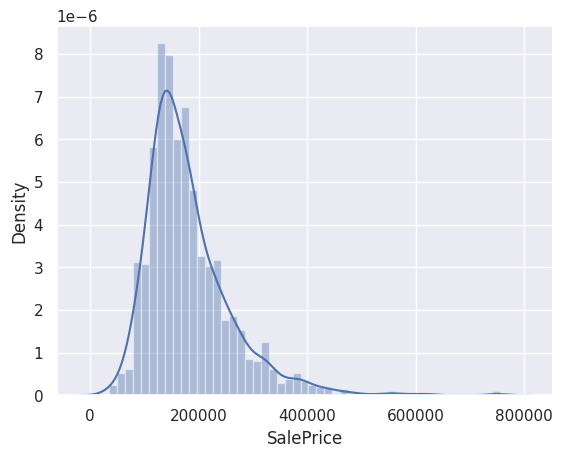

In [13]:
sns.distplot(train['SalePrice']);

## The Price Behave Over The Years

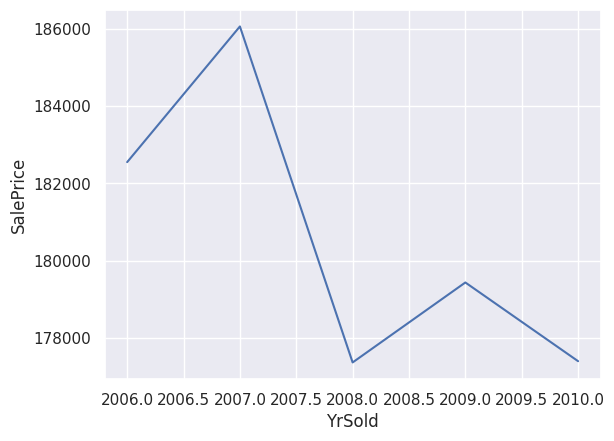

In [14]:
avg_price_per_years = train.groupby(['YrSold'], as_index=False).agg({'SalePrice':'mean'})
sns.lineplot(avg_price_per_years, x='YrSold', y='SalePrice');

,YrSold,MoSold,SalePrice_x,date,SalePrice_y,avg_price_per_6_month
0,2006,1,201090.000000,2006-01-01,188360.454256,NaN
1,2006,2,194322.222222,2006-02-01,188360.454256,NaN
2,2006,3,184982.200000,2006-03-01,188360.454256,NaN
3,2006,4,174312.814815,2006-04-01,188360.454256,NaN
4,2006,5,158928.289474,2006-05-01,188360.454256,NaN
5,2006,6,172283.333333,2006-06-01,188360.454256,180986.476641
6,2006,7,183211.059701,2006-07-01,188360.454256,178006.653258
7,2006,8,196239.956522,2006-08-01,188360.454256,178326.275641
8,2006,9,223768.866667,2006-09-01,188360.454256,184790.720085
9,2006,10,172356.708333,2006-10-01,188360.454256,184464.702338


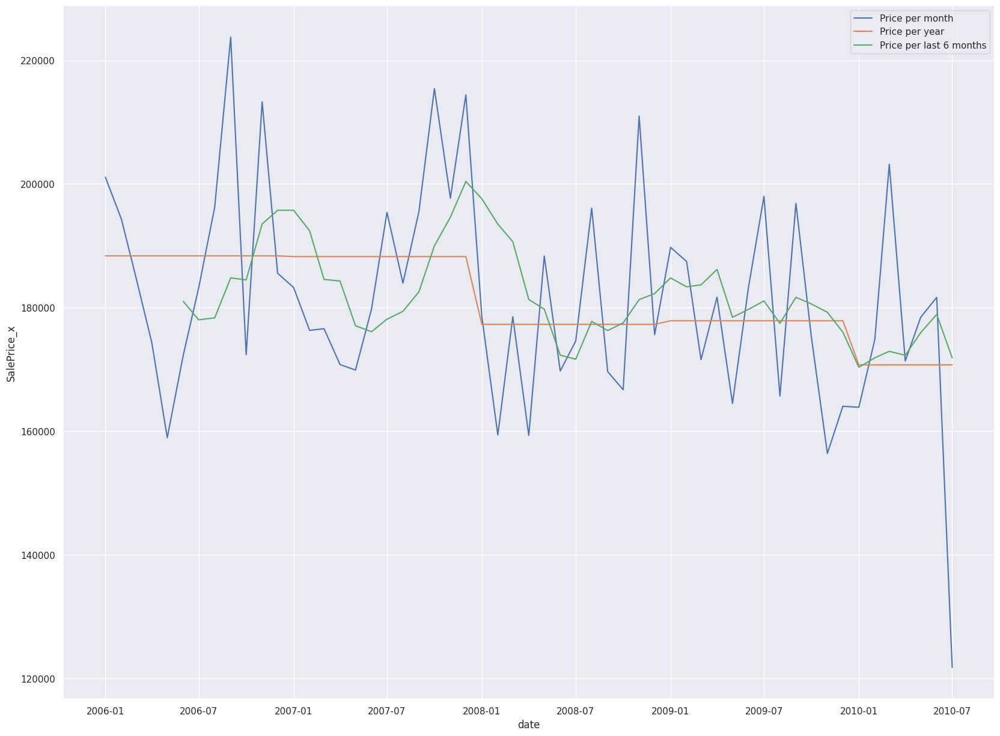

In [15]:
avg_price_per_month = train.groupby(['YrSold','MoSold'], as_index=False).agg({'SalePrice':'mean'})
avg_price_per_month['date'] = ((avg_price_per_month['MoSold']).astype ( str )+'-'+(avg_price_per_month['YrSold']).astype ( str )).astype('datetime64[ns]')
avg_price_per_month = pd.merge(avg_price_per_month,avg_price_per_month.groupby('YrSold').agg({'SalePrice':'mean'}),how='left',on='YrSold')
avg_price_per_month['avg_price_per_6_month'] = avg_price_per_month.rolling(window=6).agg({'SalePrice_x':'mean'})
sns.set(rc={'figure.figsize':(20,15)})
sns.lineplot(avg_price_per_month, x='date', y='SalePrice_x', label="Price per month")
sns.lineplot(avg_price_per_month, x='date', y='SalePrice_y', label="Price per year")
sns.lineplot(avg_price_per_month, x='date', y='avg_price_per_6_month', label="Price per last 6 months")
avg_price_per_month

## Plot The Feature's Distributions

In [64]:
numeric_data = train.iloc[:,:-1].select_dtypes([np.number])

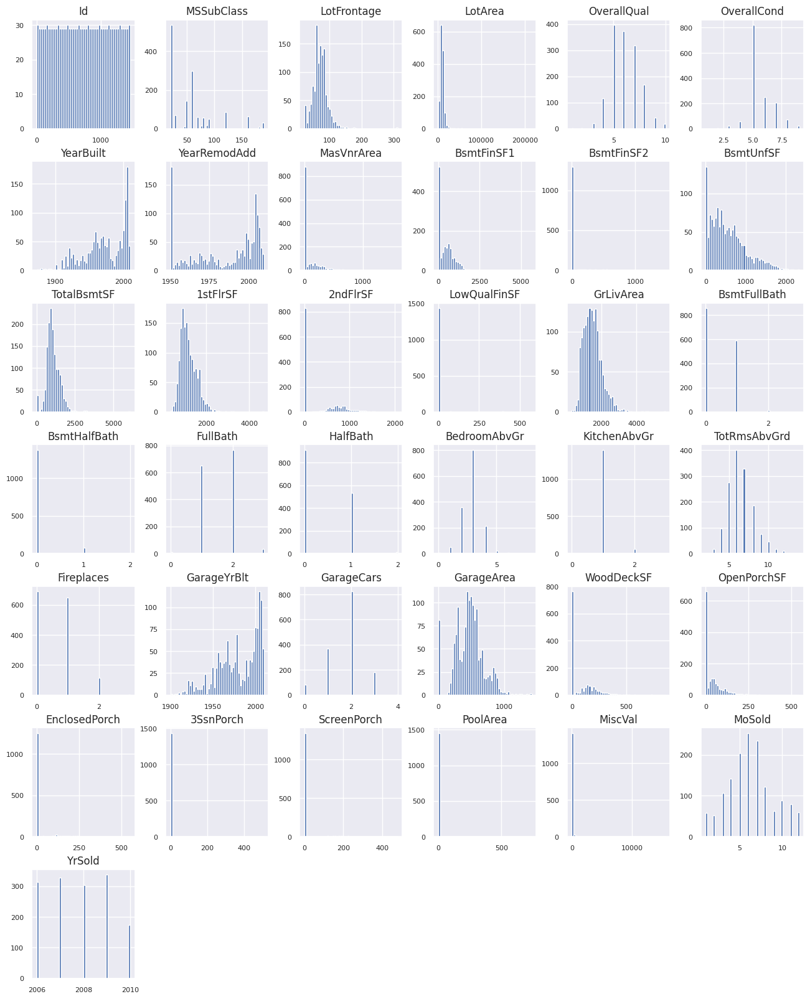

In [17]:
numeric_data.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8);

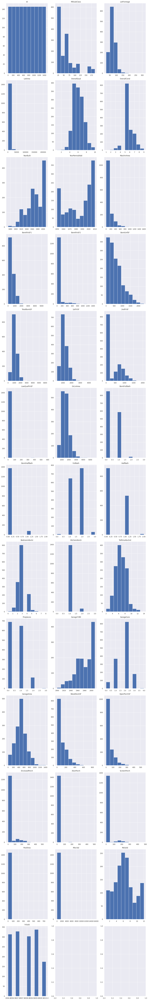

In [18]:
fig, axs = plt.subplots(figsize=(15,100),nrows=(numeric_data.columns.size+2)//3 , ncols=3)
i=0
no_hist = []
for i, f in enumerate(numeric_data.columns):
  j = i // 3
  k = i % 3
  try:
    df = train[[f,'SalePrice']].dropna()
    axs[j,k].hist(df[f])
    axs[j,k].set_title(f)

  except:
    no_hist.append(f)
    #print(f'for {feature} we could not plot a histogram')

plt.tight_layout()

MSZoning ['RL' 'RM' 'C (all)' 'FV' 'RH']
Street ['Pave' 'Grvl']
Alley [nan 'Grvl' 'Pave']
LotShape ['Reg' 'IR1' 'IR2' 'IR3']
LandContour ['Lvl' 'Bnk' 'Low' 'HLS']
Utilities ['AllPub' 'NoSeWa']
LotConfig ['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']
LandSlope ['Gtl' 'Mod' 'Sev']
Neighborhood ['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'NWAmes'
 'OldTown' 'BrkSide' 'Sawyer' 'NridgHt' 'NAmes' 'SawyerW' 'IDOTRR'
 'MeadowV' 'Edwards' 'Timber' 'Gilbert' 'StoneBr' 'ClearCr' 'NPkVill'
 'Blmngtn' 'BrDale' 'SWISU' 'Blueste']
Condition1 ['Norm' 'Feedr' 'PosN' 'Artery' 'RRAe' 'RRNn' 'RRAn' 'PosA' 'RRNe']
Condition2 ['Norm' 'Artery' 'RRNn' 'Feedr' 'PosN' 'PosA' 'RRAn' 'RRAe']
BldgType ['1Fam' '2fmCon' 'Duplex' 'TwnhsE' 'Twnhs']
HouseStyle ['2Story' '1Story' '1.5Fin' '1.5Unf' 'SFoyer' 'SLvl' '2.5Unf' '2.5Fin']
RoofStyle ['Gable' 'Hip' 'Gambrel' 'Mansard' 'Flat' 'Shed']
RoofMatl ['CompShg' 'WdShngl' 'Metal' 'WdShake' 'Membran' 'Tar&Grv' 'Roll'
 'ClyTile']
Exterior1st ['VinylSd' 'MetalSd'

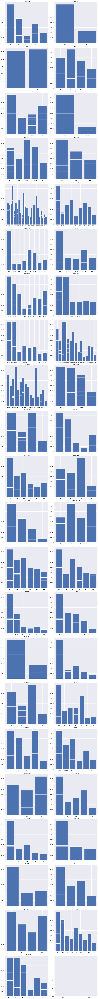

In [19]:
object_data = train.select_dtypes([object])
object_features = {}
fig, axs = plt.subplots(figsize=(15,150),nrows=(object_data.columns.size+1)//2 , ncols=2)
no_bar = []
for i,f in enumerate(object_data.columns):
  print(f, pd.unique(object_data[f]))
  object_features[f] = pd.unique(object_data[f])
  j = i // 2
  k = i % 2
  try:
    df = train[[f,'SalePrice']].dropna()
    axs[j,k].bar(df[f],df['SalePrice'])
    axs[j,k].set_title(f)

  except:
    no_bar.append(f)
    #print(f'for {f} we could not plot a barplot')

plt.tight_layout()

# Correlation Between Features And Label

OverallQual      0.790982
GrLivArea        0.708624
GarageCars       0.640409
GarageArea       0.623431
TotalBsmtSF      0.613581
1stFlrSF         0.605852
FullBath         0.560664
TotRmsAbvGrd     0.533723
YearBuilt        0.522897
YearRemodAdd     0.507101
GarageYrBlt      0.486362
MasVnrArea       0.477493
Fireplaces       0.466929
BsmtFinSF1       0.386420
LotFrontage      0.351799
WoodDeckSF       0.324413
2ndFlrSF         0.319334
OpenPorchSF      0.315856
HalfBath         0.284108
LotArea          0.263843
BsmtFullBath     0.227122
BsmtUnfSF        0.214479
BedroomAbvGr     0.168213
ScreenPorch      0.111447
PoolArea         0.092404
MoSold           0.046432
3SsnPorch        0.044584
BsmtFinSF2      -0.011378
BsmtHalfBath    -0.016844
MiscVal         -0.021190
Id              -0.021917
LowQualFinSF    -0.025606
YrSold          -0.028923
OverallCond     -0.077856
MSSubClass      -0.084284
EnclosedPorch   -0.128578
KitchenAbvGr    -0.135907
dtype: float64

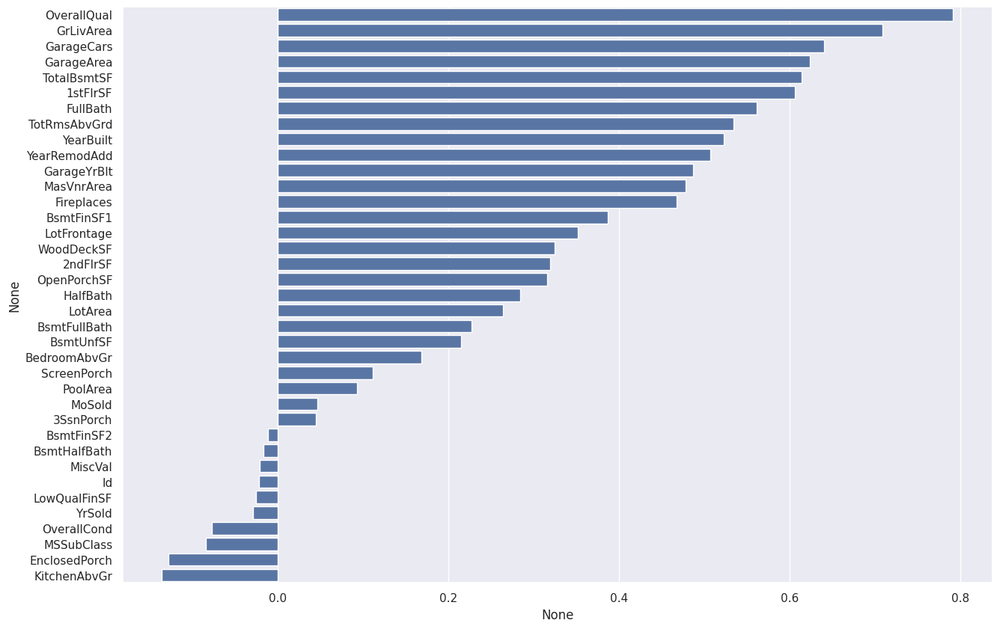

In [20]:
correlations = train.drop('SalePrice',axis=1).corrwith(train['SalePrice']).sort_values(ascending=False)
plot = sns.barplot(y=correlations.index, x=correlations)
plot.figure.set_size_inches(15, 10)
correlations

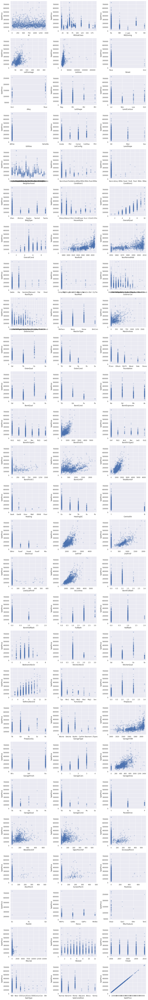

In [21]:
fig, axs = plt.subplots(figsize=(15,100),nrows=(train.columns.size+2)//3, ncols=3)
for i, feature in enumerate(train.columns):
    j = i // 3
    k = i % 3
    try:
      df = train[[feature,'SalePrice']].dropna()
      axs[j,k].scatter(df[feature], df['SalePrice'], alpha=0.2)
      axs[j,k].set_xlabel(feature)
      axs[j,k].set_ylabel("SalePrice")

    except:
      print(feature)

plt.tight_layout()

              SalePrice
MSZoning               
C (all)    74528.000000
FV        214014.061538
RH        131558.375000
RL        191004.994787
RM        126316.830275


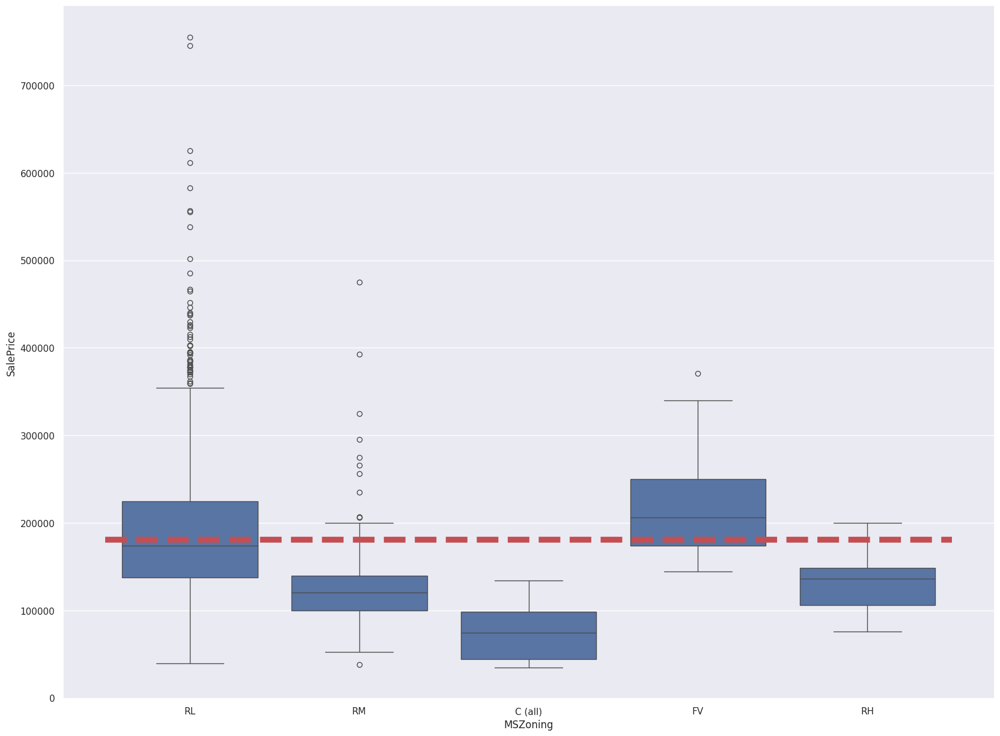

            SalePrice
Street               
Grvl    130190.500000
Pave    181130.538514


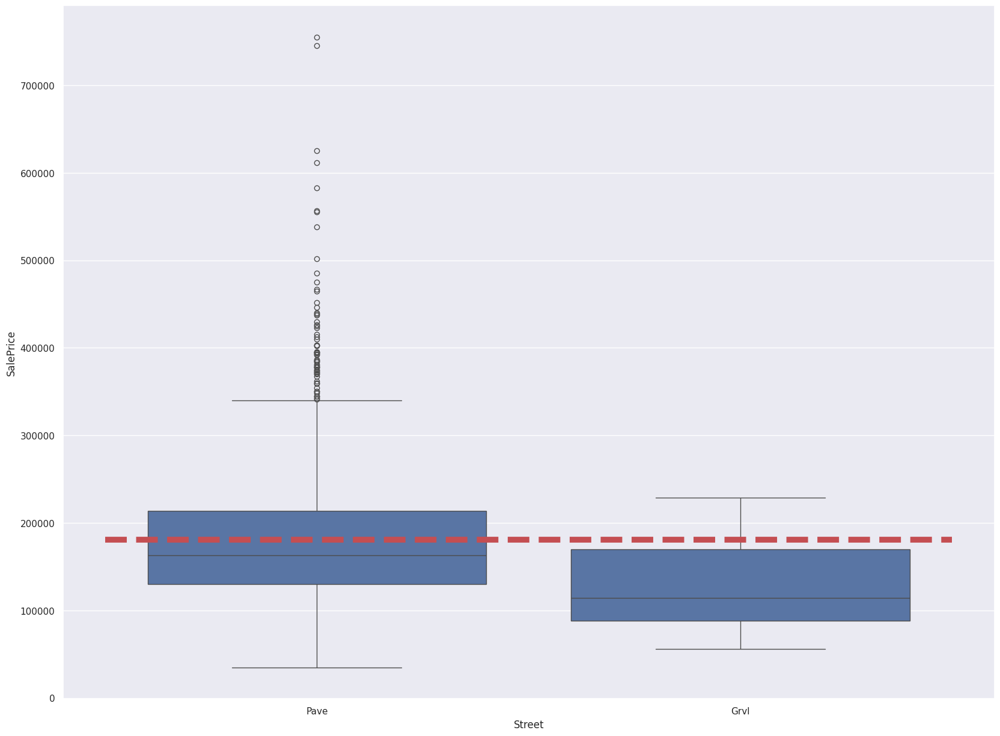

           SalePrice
Alley               
Grvl   122219.080000
Pave   168000.585366


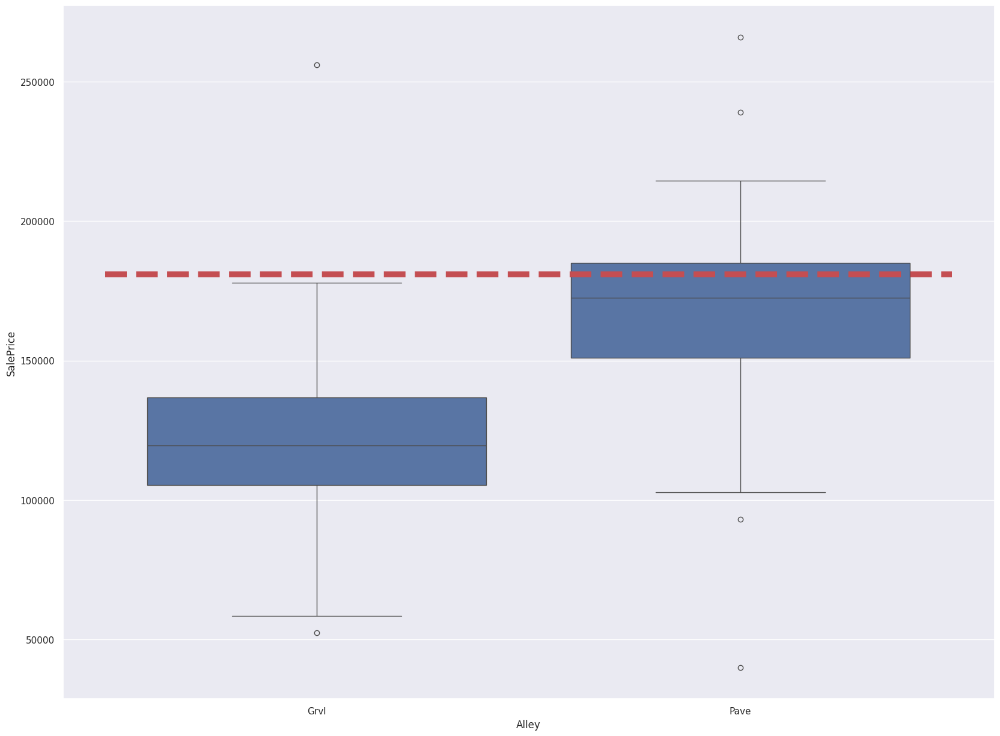

              SalePrice
LotShape               
IR1       206101.665289
IR2       239833.365854
IR3       216036.500000
Reg       164754.818378


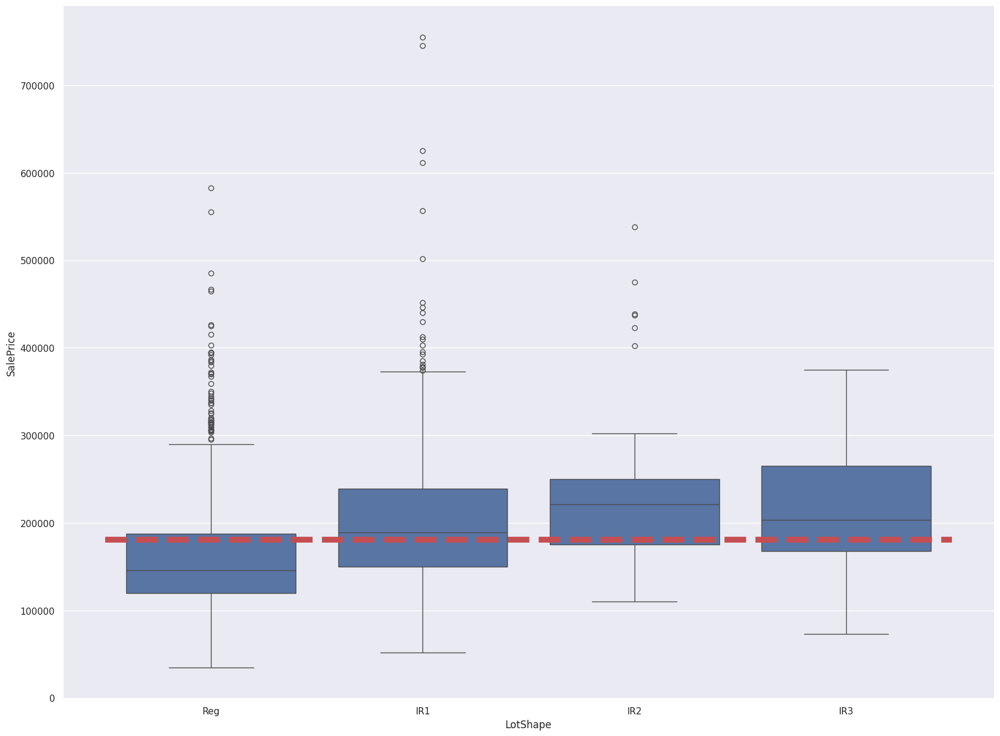

                 SalePrice
LandContour               
Bnk          143104.079365
HLS          231533.940000
Low          203661.111111
Lvl          180183.746758


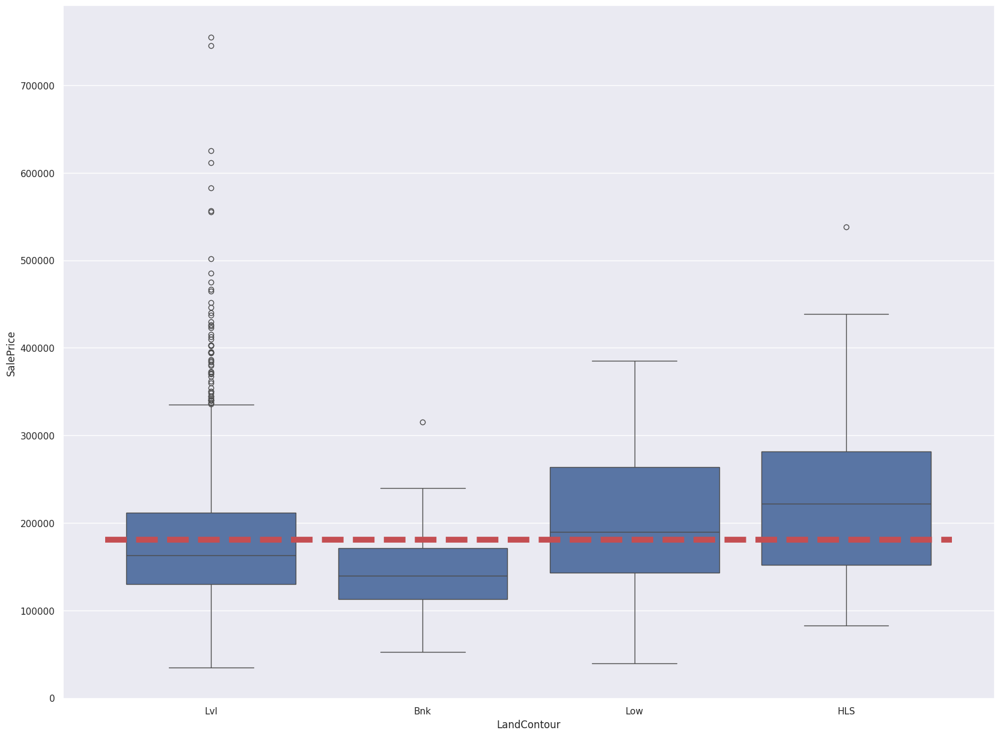

              SalePrice
Utilities              
AllPub     180950.95682
NoSeWa     137500.00000


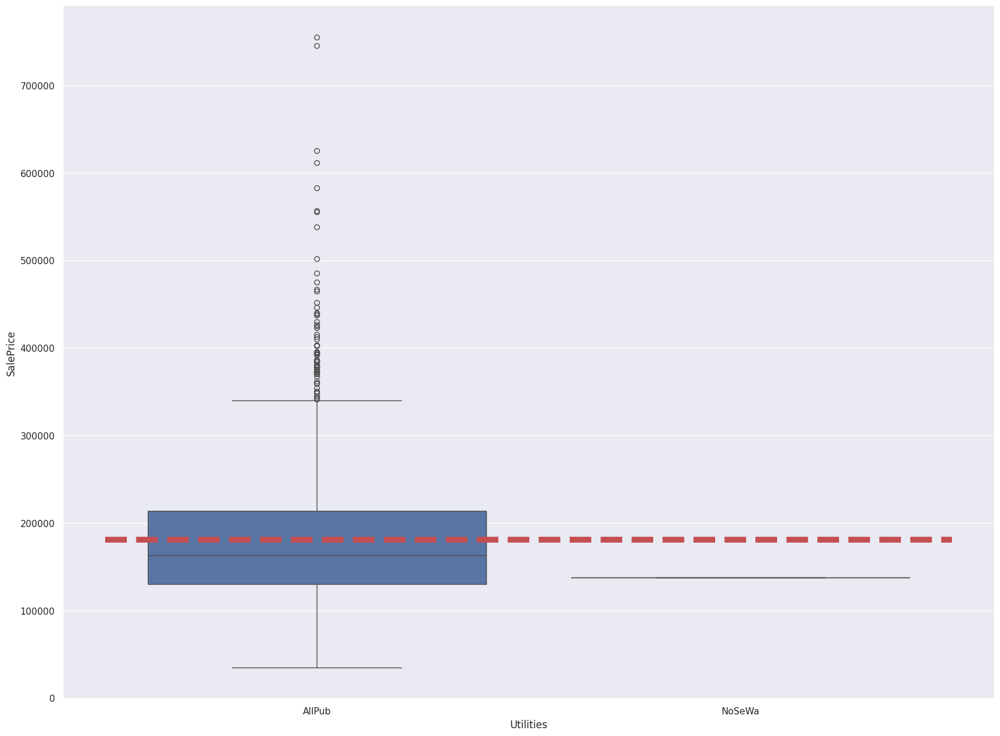

               SalePrice
LotConfig               
Corner     181623.425856
CulDSac    223854.617021
FR2        177934.574468
FR3        208475.000000
Inside     176938.047529


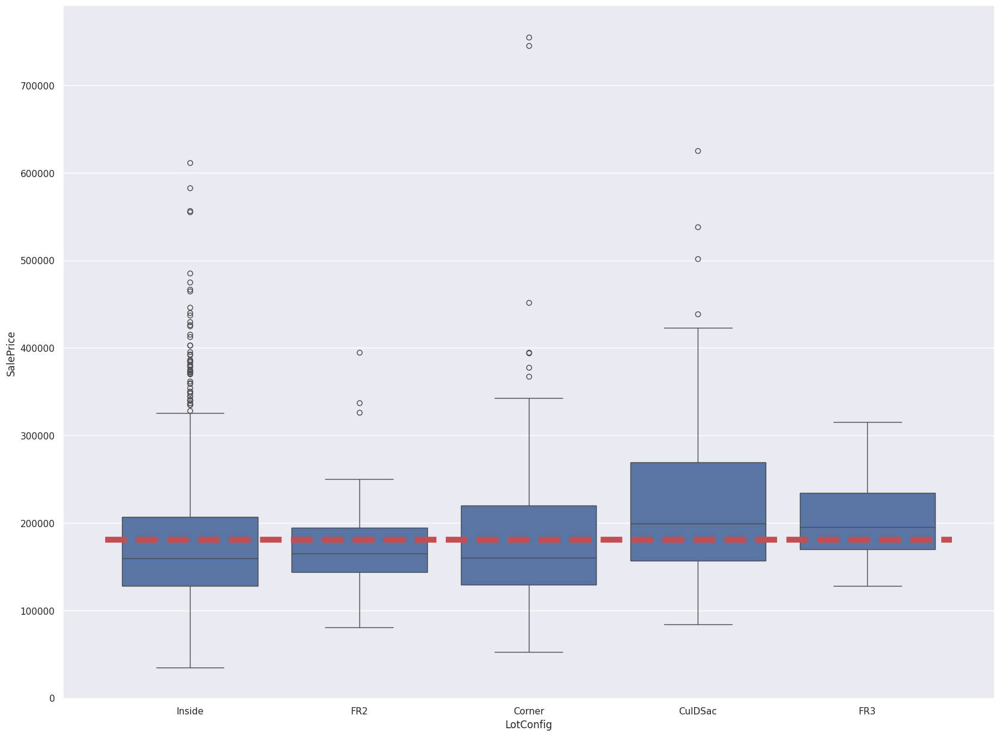

               SalePrice
LandSlope               
Gtl        179956.799566
Mod        196734.138462
Sev        204379.230769


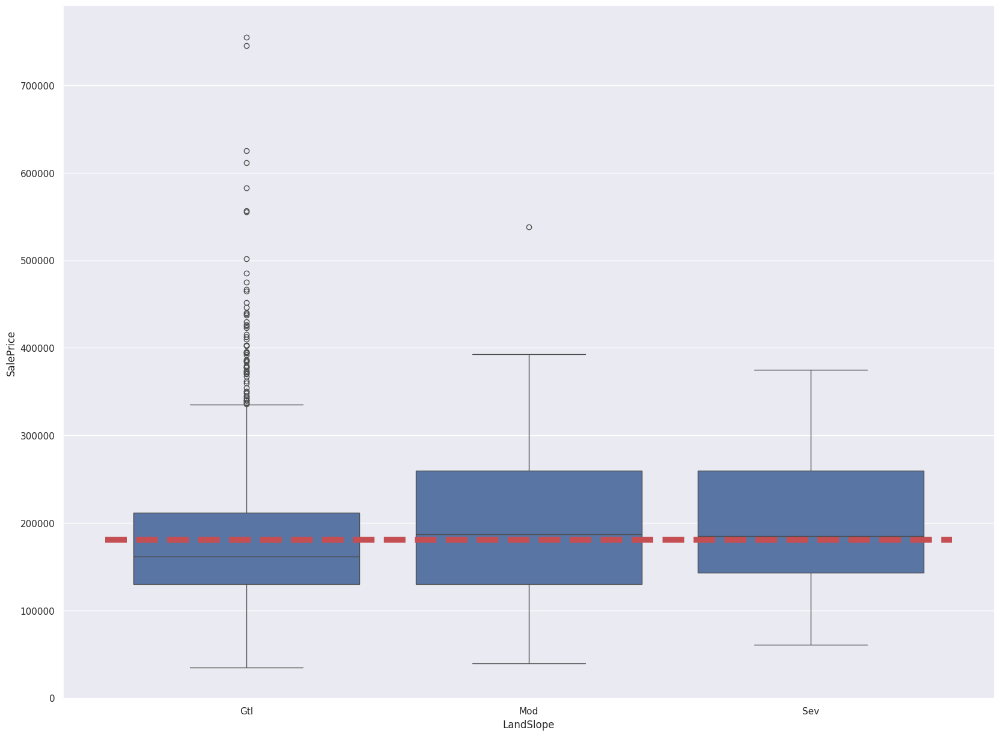

                  SalePrice
Neighborhood               
Blmngtn       194870.882353
Blueste       137500.000000
BrDale        104493.750000
BrkSide       124834.051724
ClearCr       212565.428571
CollgCr       197965.773333
Crawfor       210624.725490
Edwards       128219.700000
Gilbert       192854.506329
IDOTRR        100123.783784
MeadowV        98576.470588
Mitchel       156270.122449
NAmes         145847.080000
NPkVill       142694.444444
NWAmes        189050.068493
NoRidge       335295.317073
NridgHt       316270.623377
OldTown       128225.300885
SWISU         142591.360000
Sawyer        136793.135135
SawyerW       186555.796610
Somerst       225379.837209
StoneBr       310499.000000
Timber        242247.447368
Veenker       238772.727273


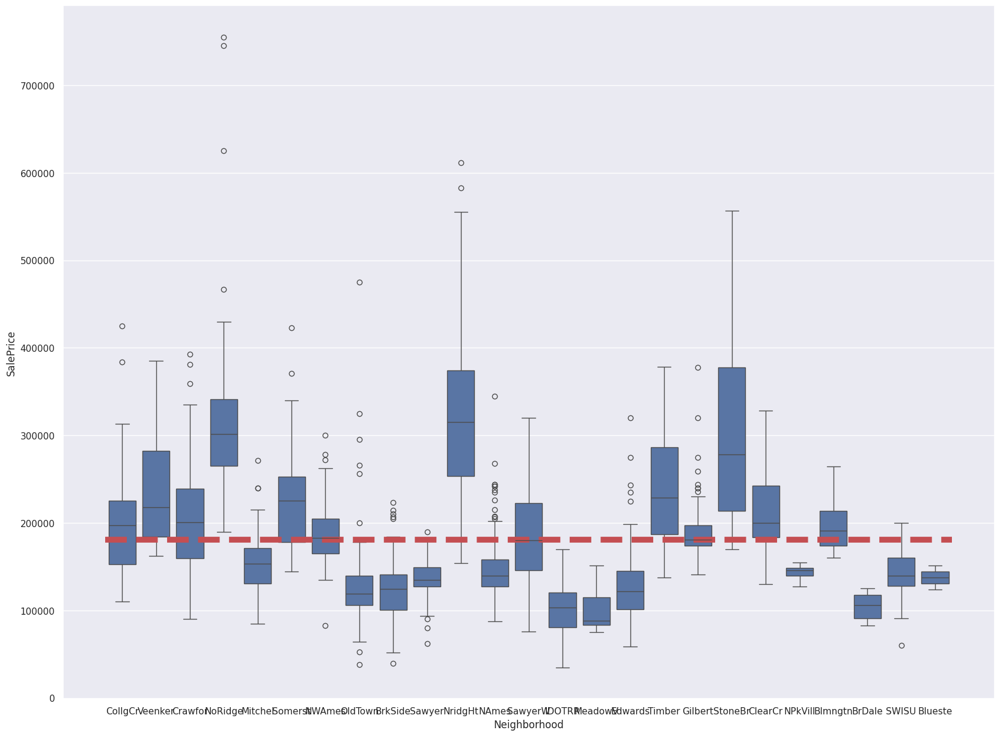

                SalePrice
Condition1               
Artery      135091.666667
Feedr       142475.481481
Norm        184495.492063
PosA        225875.000000
PosN        215184.210526
RRAe        138400.000000
RRAn        184396.615385
RRNe        190750.000000
RRNn        212400.000000


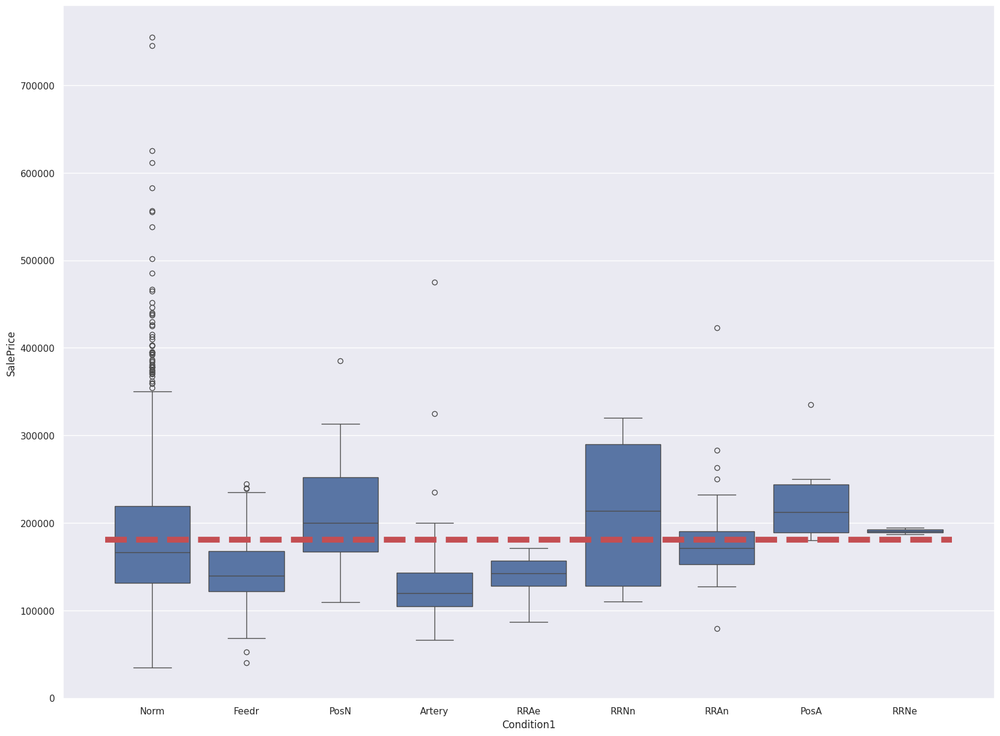

                SalePrice
Condition2               
Artery      106500.000000
Feedr       121166.666667
Norm        181169.405536
PosA        325000.000000
PosN        284875.000000
RRAe        190000.000000
RRAn        136905.000000
RRNn         96750.000000


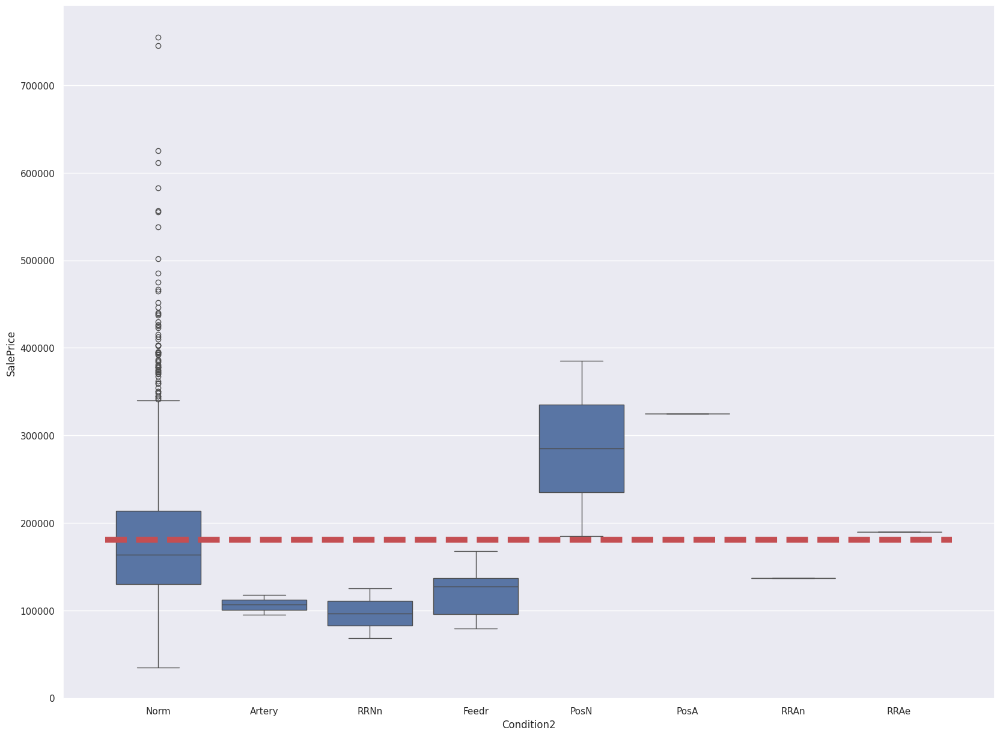

              SalePrice
BldgType               
1Fam      185763.807377
2fmCon    128432.258065
Duplex    133541.076923
Twnhs     135911.627907
TwnhsE    181959.342105


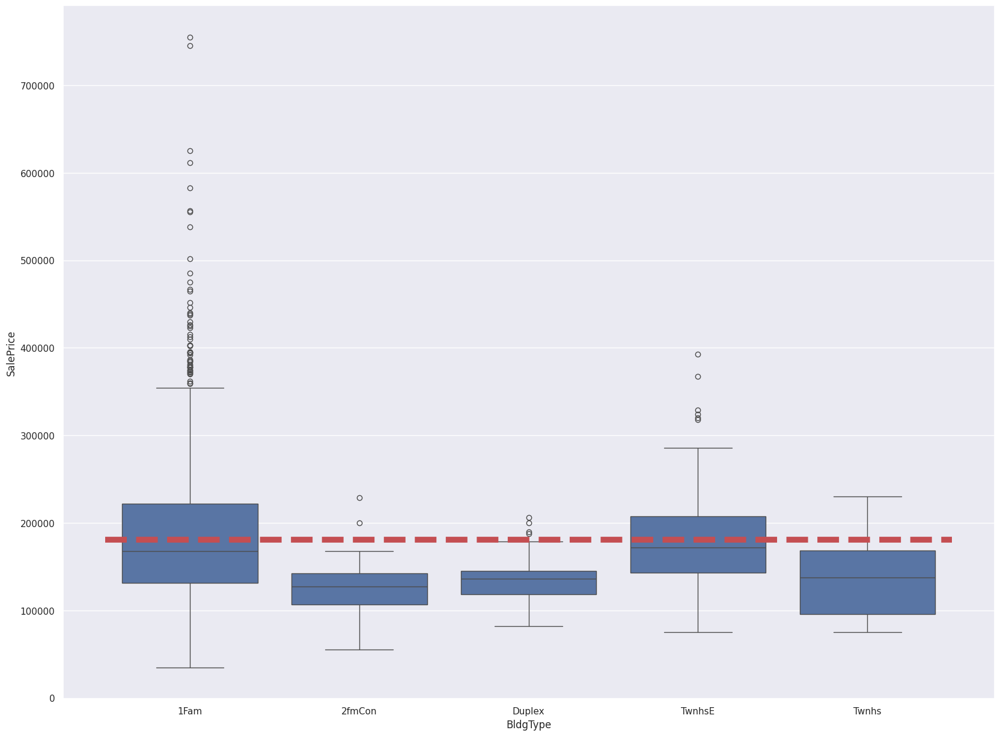

                SalePrice
HouseStyle               
1.5Fin      143116.740260
1.5Unf      110150.000000
1Story      175985.477961
2.5Fin      220000.000000
2.5Unf      157354.545455
2Story      210051.764045
SFoyer      135074.486486
SLvl        166703.384615


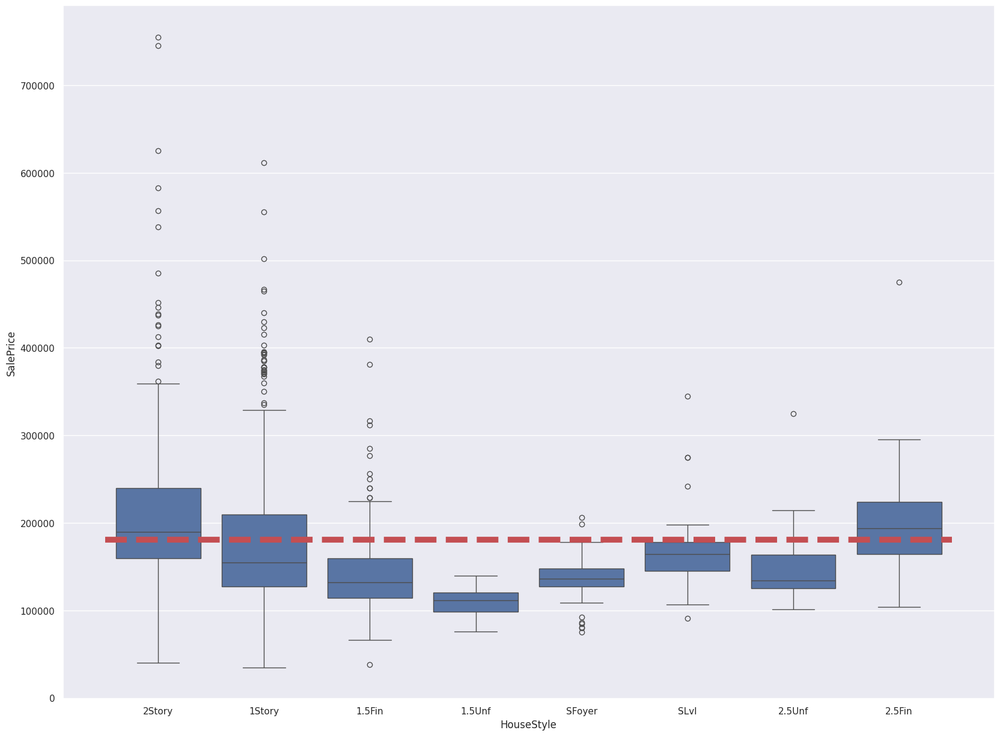

               SalePrice
RoofStyle               
Flat       194690.000000
Gable      171483.956179
Gambrel    148909.090909
Hip        218876.933566
Mansard    180568.428571
Shed       225000.000000


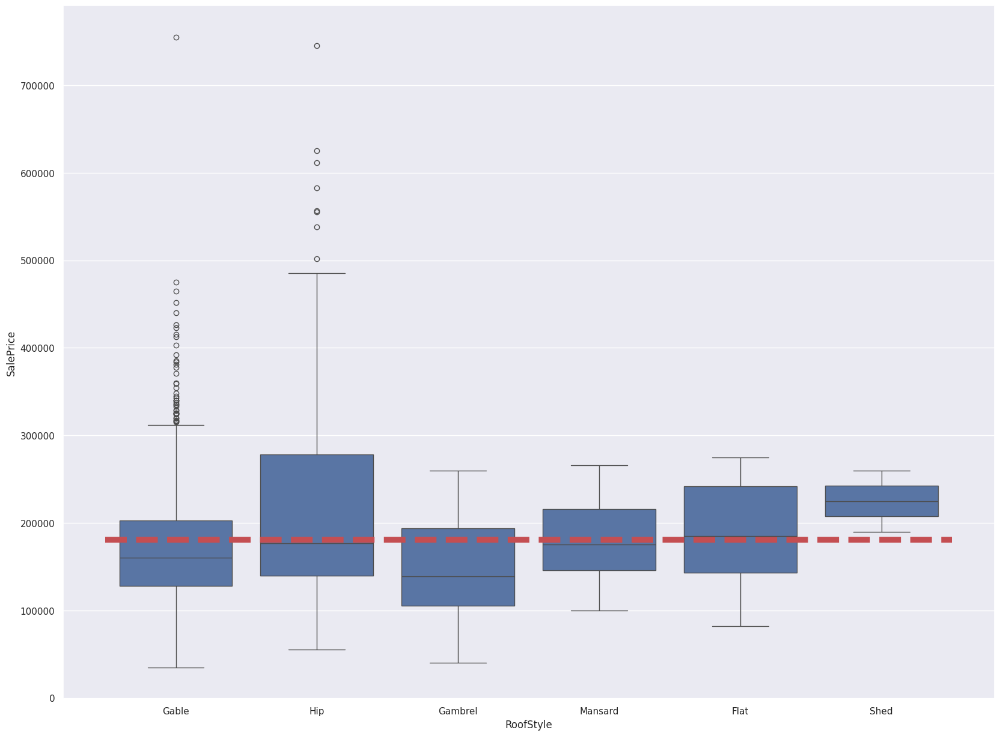

              SalePrice
RoofMatl               
ClyTile   160000.000000
CompShg   179803.679219
Membran   241500.000000
Metal     180000.000000
Roll      137000.000000
Tar&Grv   185406.363636
WdShake   241400.000000
WdShngl   390250.000000


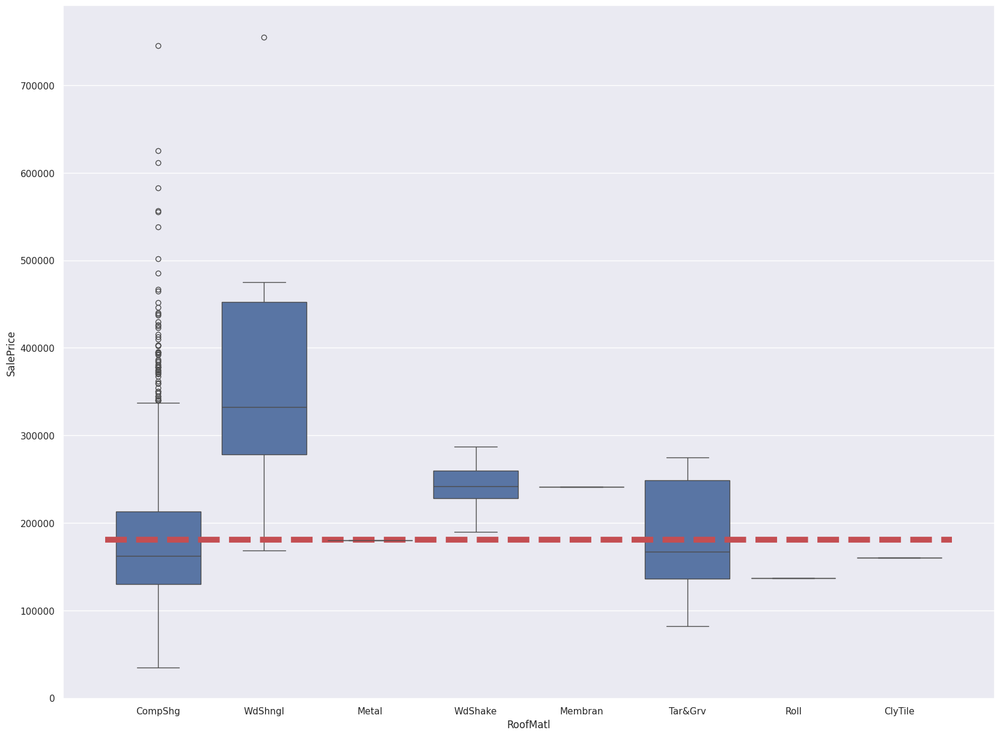

                 SalePrice
Exterior1st               
AsbShng      107385.550000
AsphShn      100000.000000
BrkComm       71000.000000
BrkFace      194573.000000
CBlock       105000.000000
CemntBd      231690.655738
HdBoard      163077.450450
ImStucc      262000.000000
MetalSd      149422.177273
Plywood      175942.379630
Stone        258500.000000
Stucco       162990.000000
VinylSd      213732.900971
Wd Sdng      149841.645631
WdShing      150655.076923


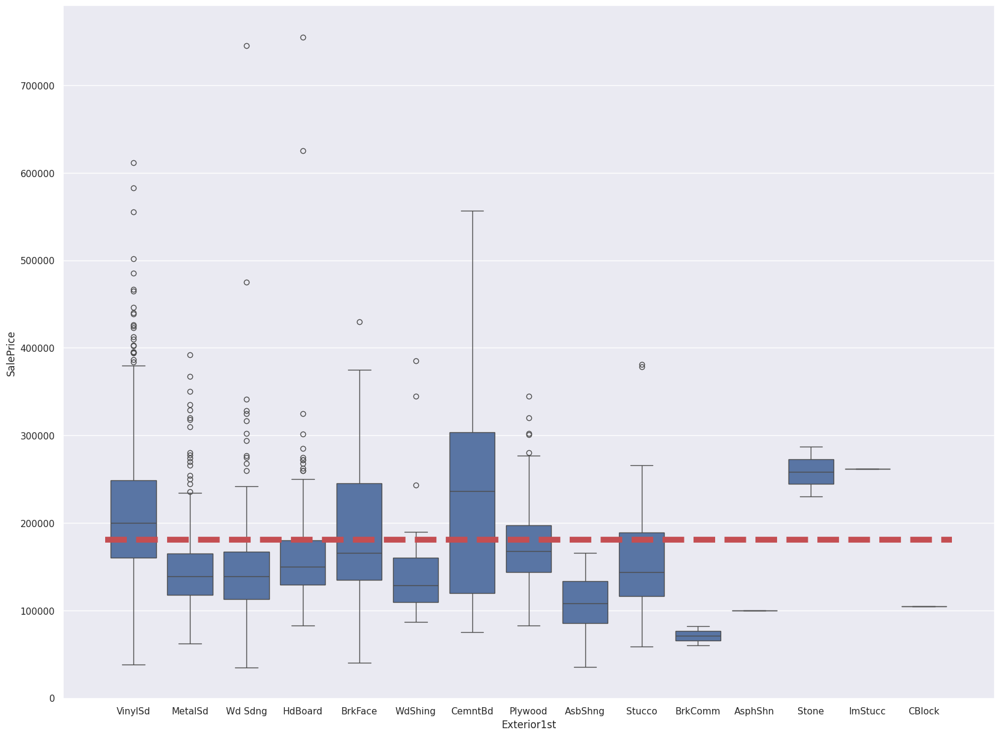

                 SalePrice
Exterior2nd               
AsbShng      114060.550000
AsphShn      138000.000000
Brk Cmn      126714.285714
BrkFace      195818.000000
CBlock       105000.000000
CmentBd      230093.833333
HdBoard      167661.565217
ImStucc      252070.000000
MetalSd      149803.172897
Other        319000.000000
Plywood      168112.387324
Stone        158224.800000
Stucco       155905.153846
VinylSd      214432.460317
Wd Sdng      148386.065990
Wd Shng      161328.947368


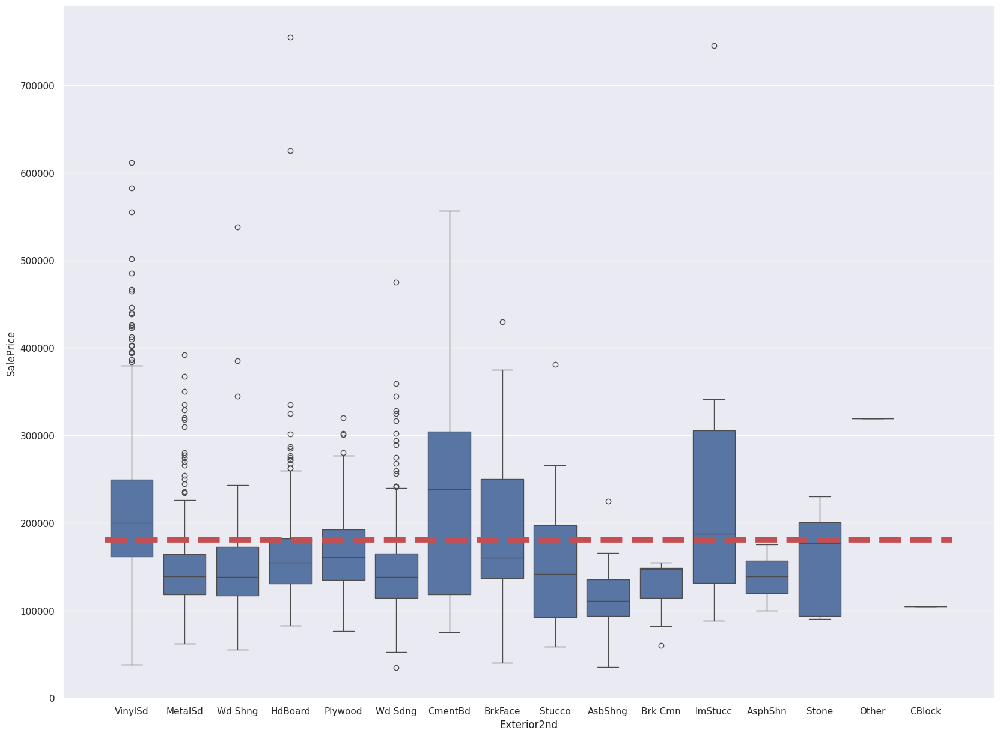

                SalePrice
MasVnrType               
BrkCmn      146318.066667
BrkFace     204691.871910
None        156221.891204
Stone       265583.625000


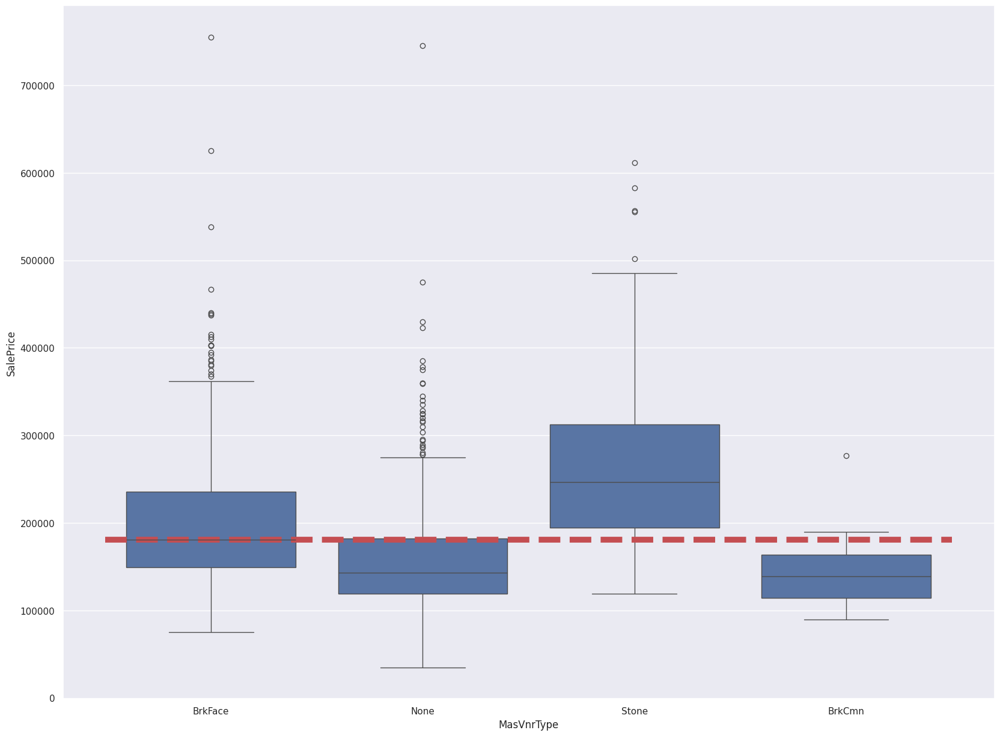

               SalePrice
ExterQual               
Ex         367360.961538
Fa          87985.214286
Gd         231633.510246
TA         144341.313466


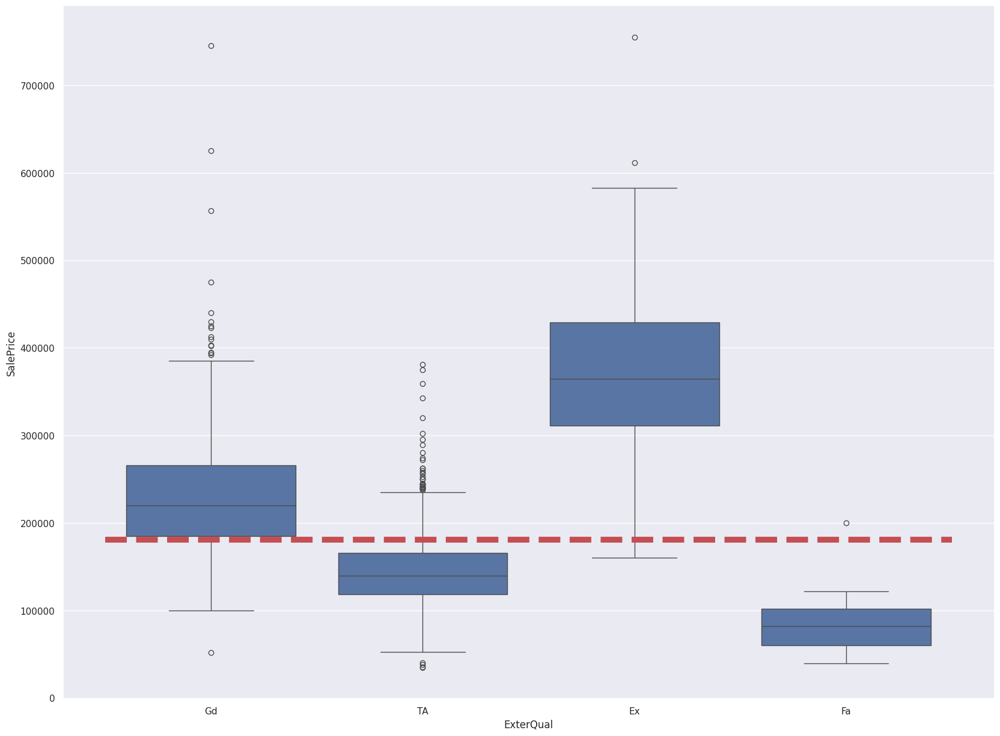

               SalePrice
ExterCond               
Ex         201333.333333
Fa         102595.142857
Gd         168897.568493
Po          76500.000000
TA         184034.896256


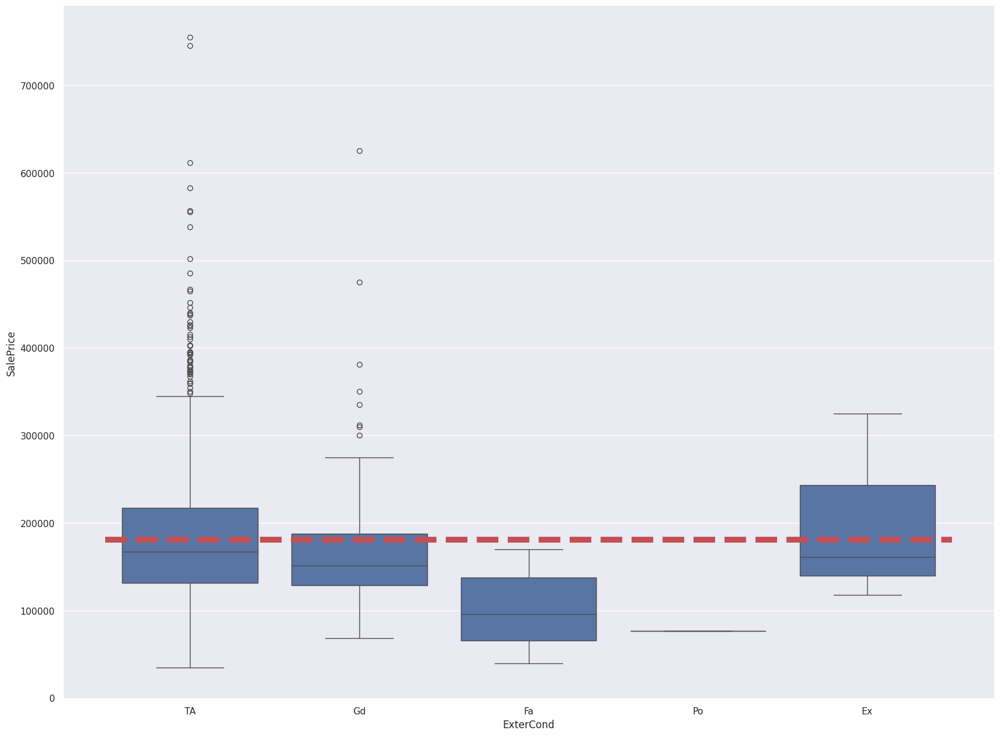

                SalePrice
Foundation               
BrkTil      132291.075342
CBlock      149805.714511
PConc       225230.442040
Slab        107365.625000
Stone       165959.166667
Wood        185666.666667


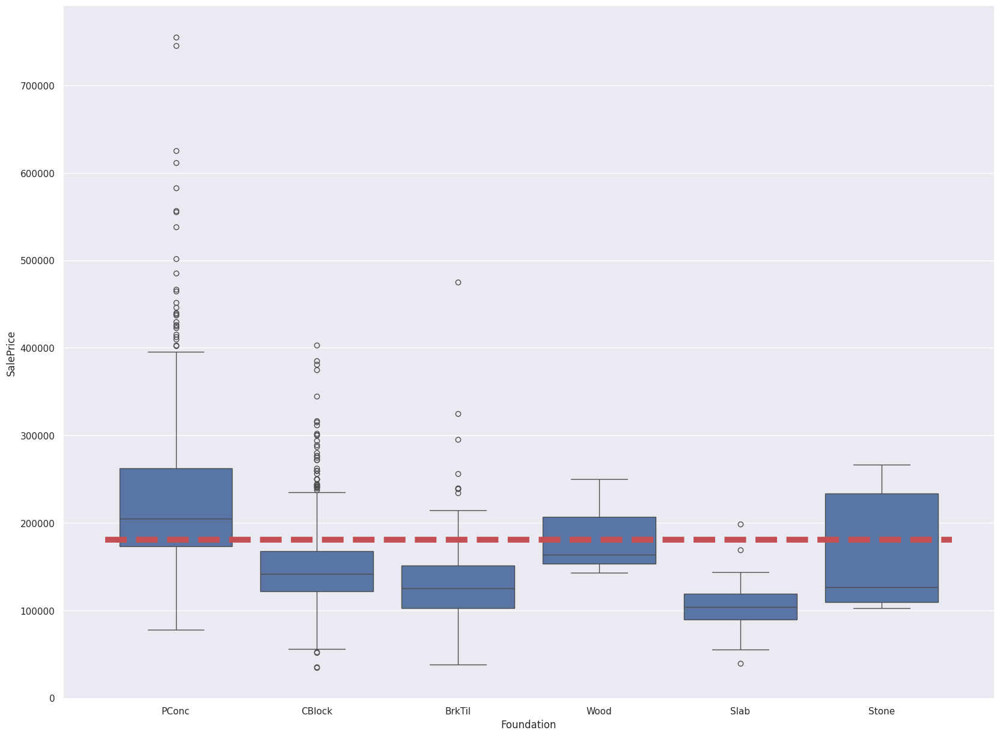

              SalePrice
BsmtQual               
Ex        327041.041322
Fa        115692.028571
Gd        202688.478964
TA        140759.818182


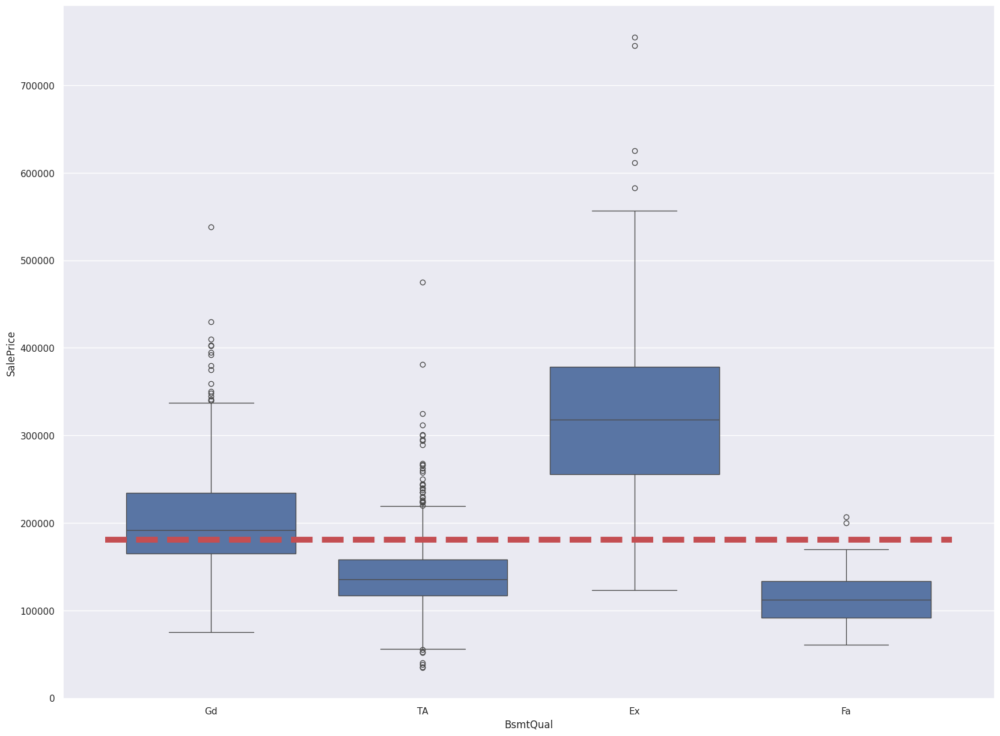

              SalePrice
BsmtCond               
Fa        121809.533333
Gd        213599.907692
Po         64000.000000
TA        183632.620900


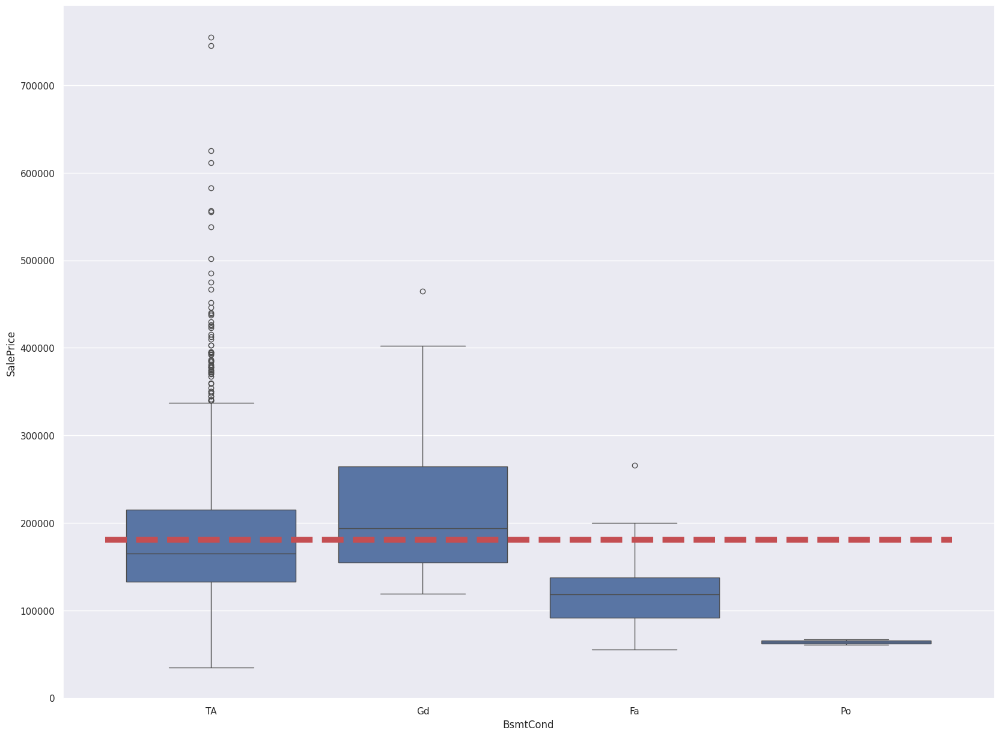

                  SalePrice
BsmtExposure               
Av            206643.420814
Gd            257689.805970
Mn            192789.657895
No            165652.295908


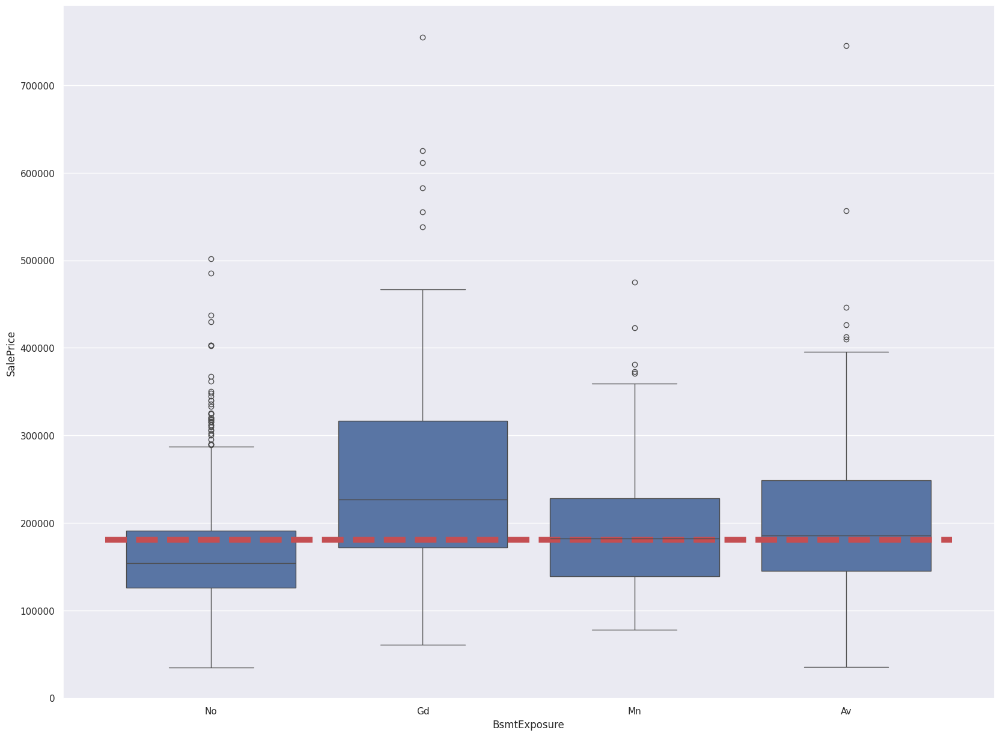

                  SalePrice
BsmtFinType1               
ALQ           161573.068182
BLQ           149493.655405
GLQ           235413.720096
LwQ           151852.702703
Rec           146889.248120
Unf           170670.576744


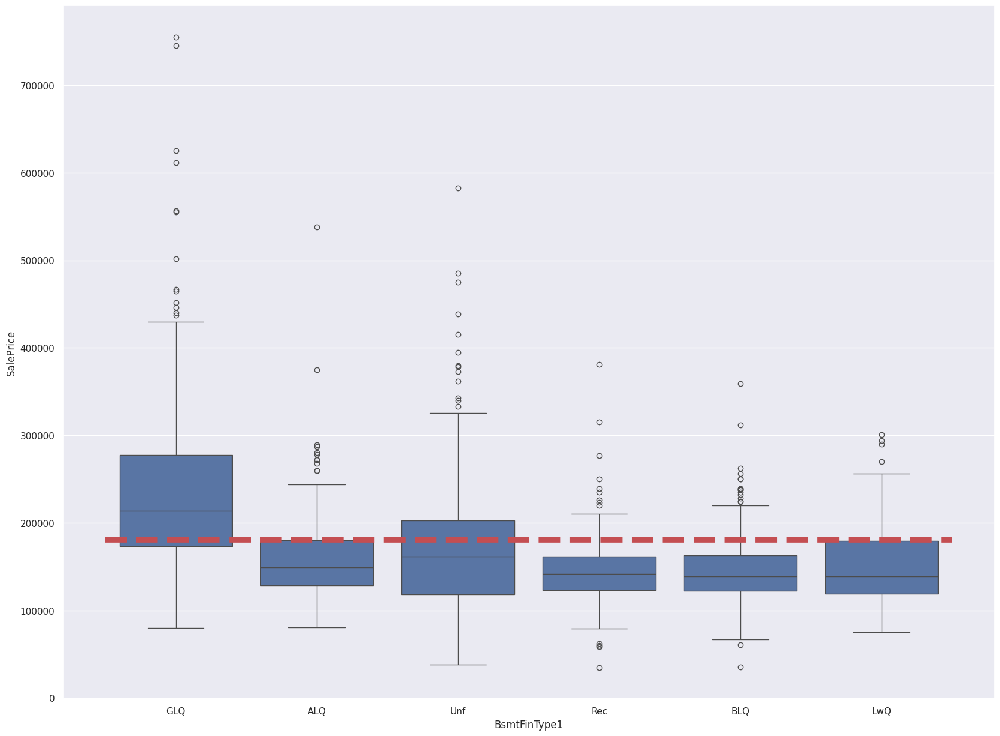

                  SalePrice
BsmtFinType2               
ALQ           209942.105263
BLQ           151101.000000
GLQ           180982.142857
LwQ           164364.130435
Rec           164917.129630
Unf           184694.690287


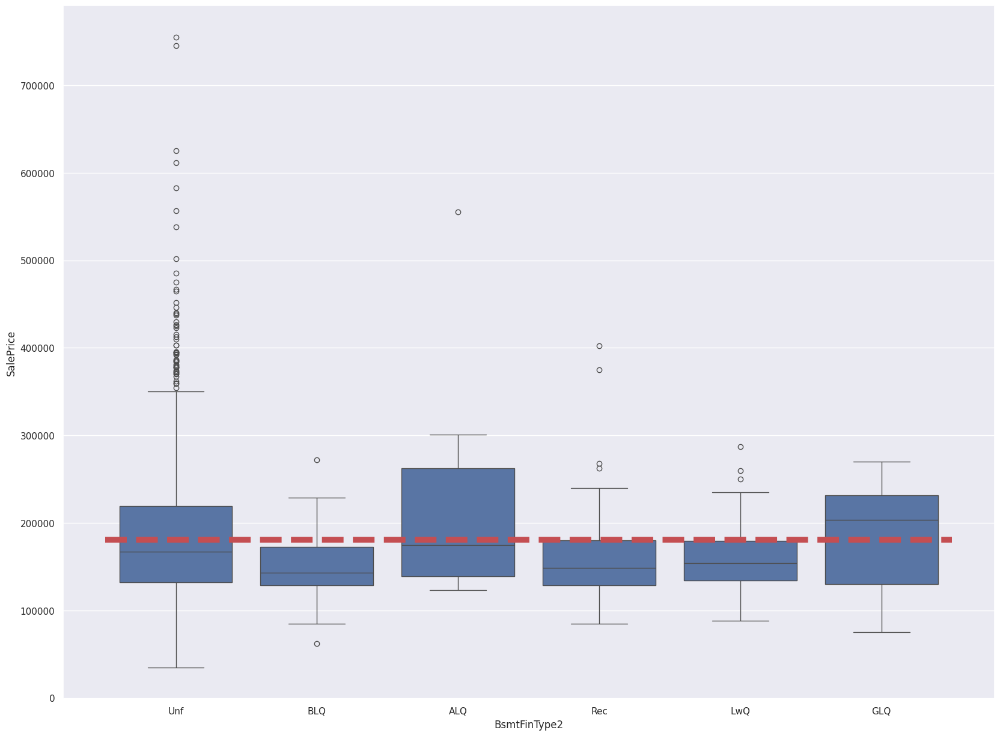

             SalePrice
Heating               
Floor     72500.000000
GasA     182021.195378
GasW     166632.166667
Grav      75271.428571
OthW     125750.000000
Wall      92100.000000


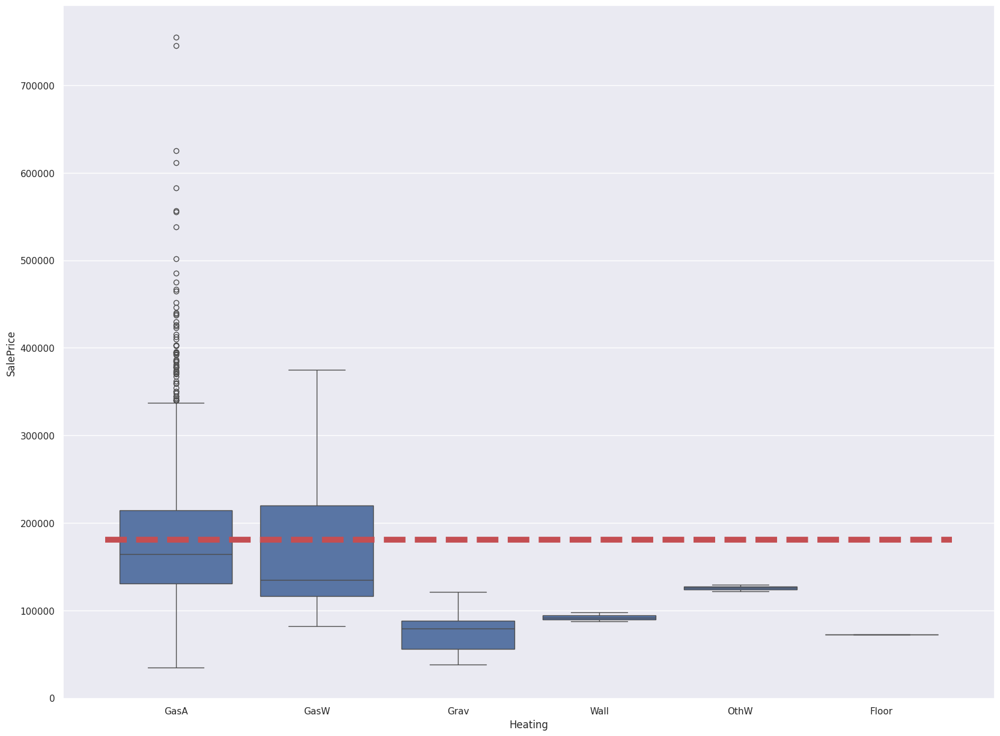

               SalePrice
HeatingQC               
Ex         214914.429150
Fa         123919.489796
Gd         156858.871369
Po          87000.000000
TA         142362.876168


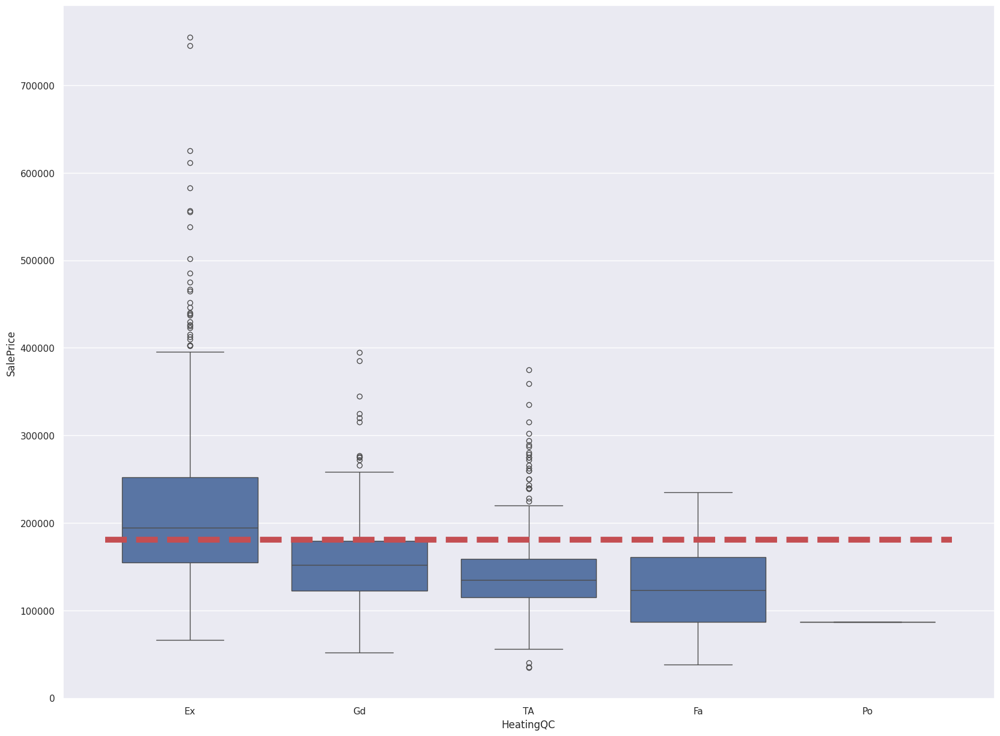

                SalePrice
CentralAir               
N           105264.073684
Y           186186.709890


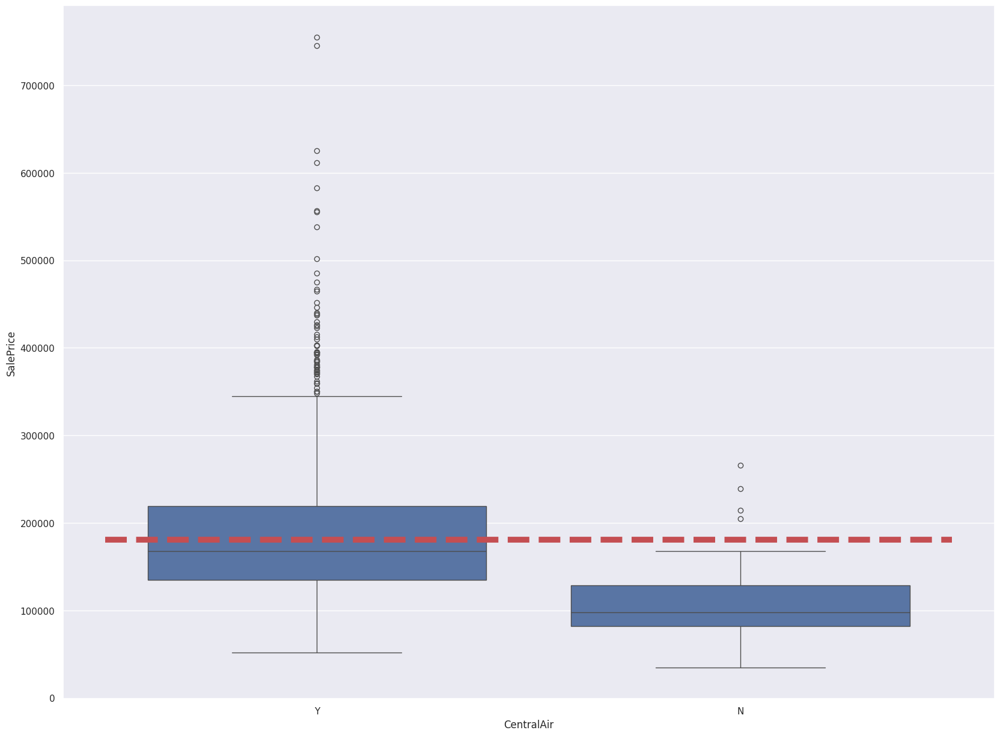

                SalePrice
Electrical               
FuseA       122196.893617
FuseF       107675.444444
FuseP        97333.333333
Mix          67000.000000
SBrkr       186825.113193


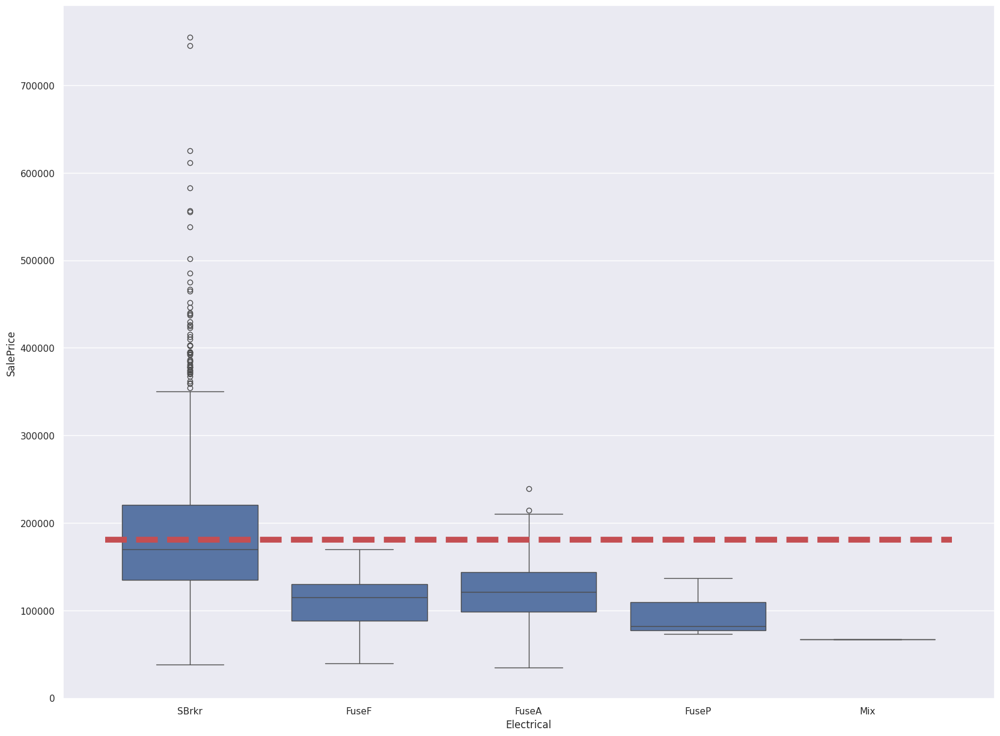

                 SalePrice
KitchenQual               
Ex           328554.670000
Fa           105565.205128
Gd           212116.023891
TA           139962.511565


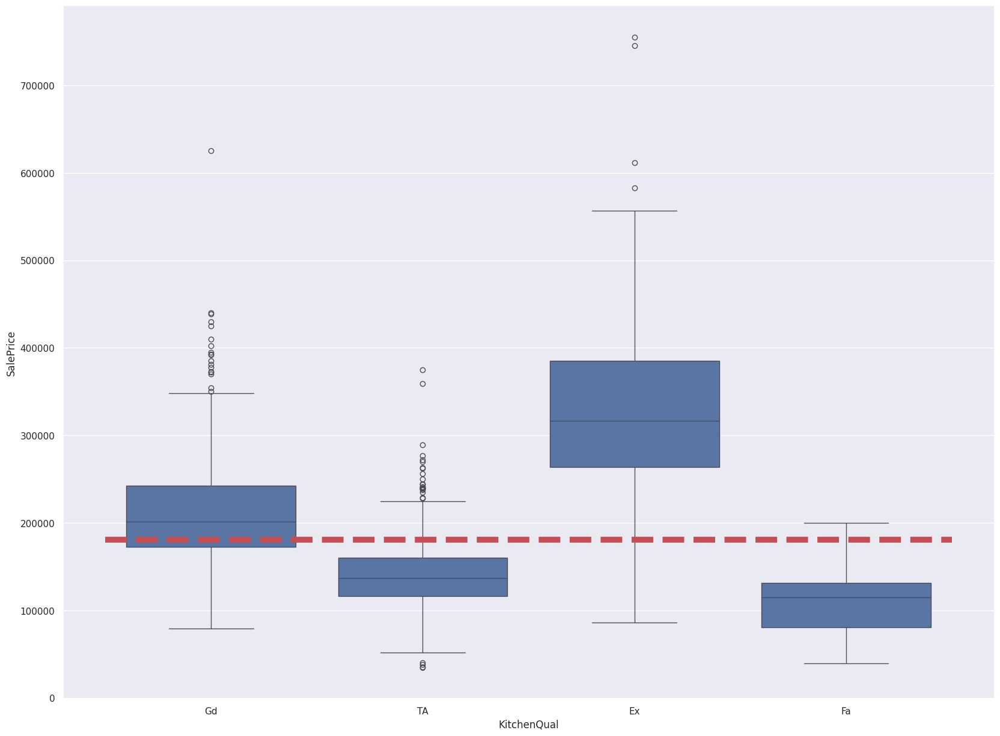

                SalePrice
Functional               
Maj1        153948.142857
Maj2         85800.000000
Min1        146385.483871
Min2        144240.647059
Mod         168393.333333
Sev         129000.000000
Typ         183429.147059


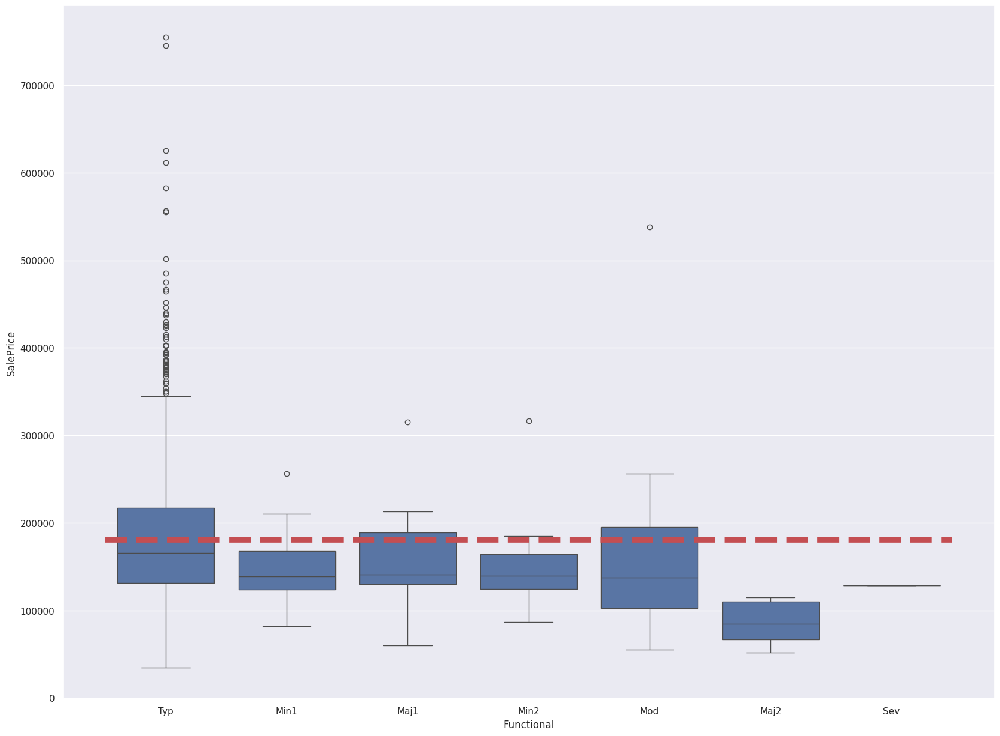

                 SalePrice
FireplaceQu               
Ex           337712.500000
Fa           167298.484848
Gd           226351.415789
Po           129764.150000
TA           205723.488818


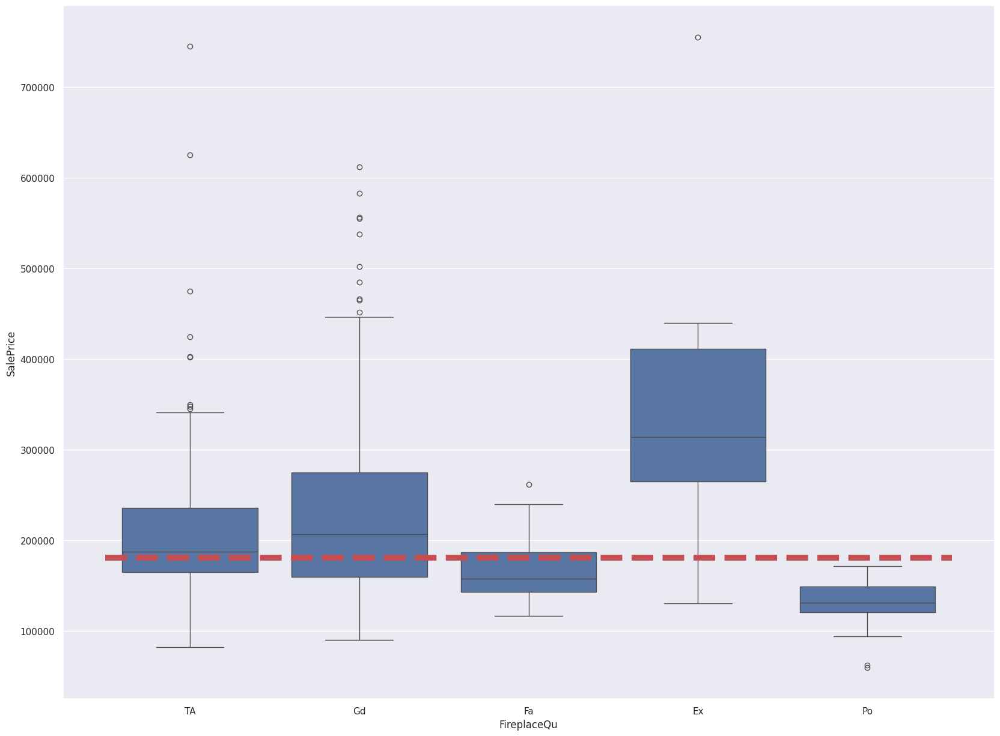

                SalePrice
GarageType               
2Types      151283.333333
Attchd      202892.656322
Basment     160570.684211
BuiltIn     254751.738636
CarPort     109962.111111
Detchd      134091.162791


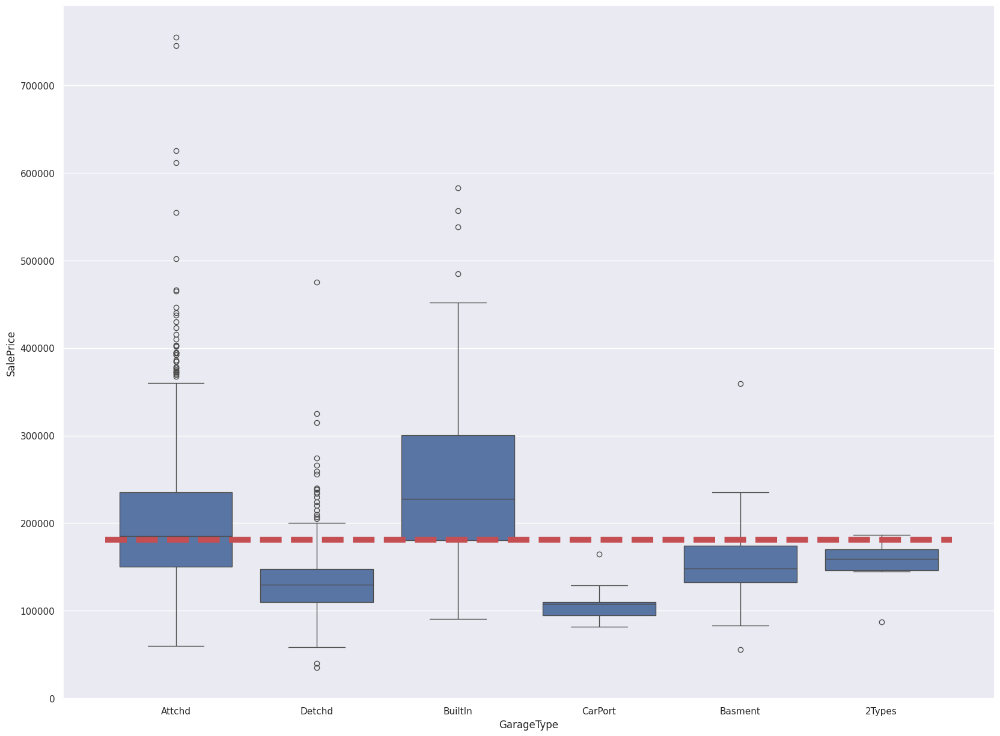

                  SalePrice
GarageFinish               
Fin           240052.690341
RFn           202068.869668
Unf           142156.423140


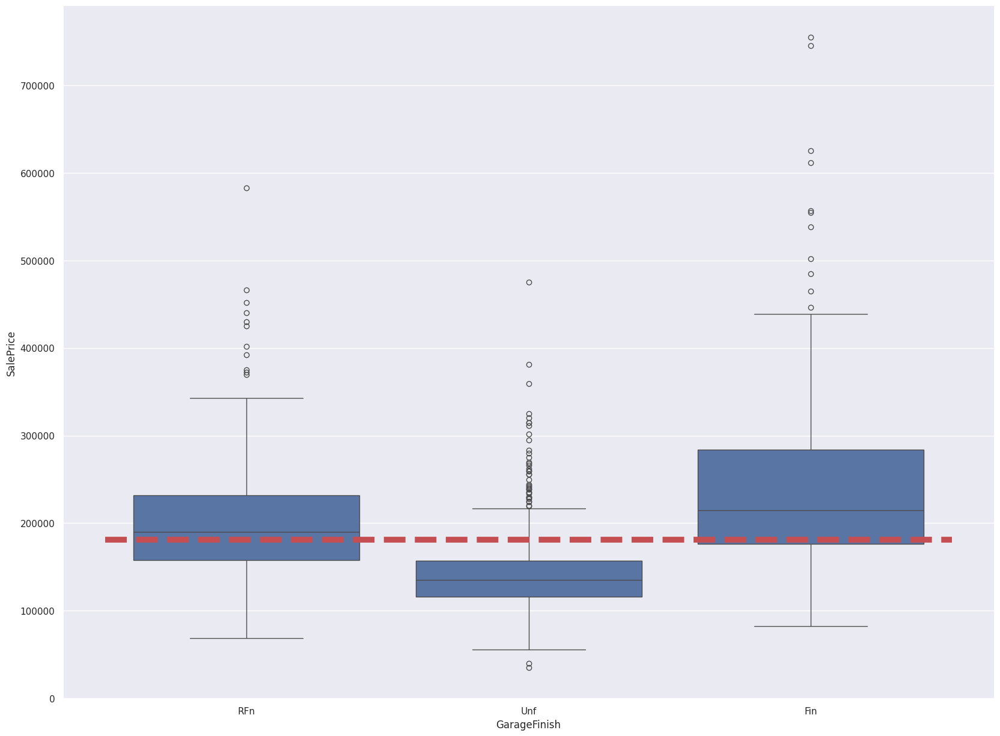

                SalePrice
GarageQual               
Ex          241000.000000
Fa          123573.354167
Gd          215860.714286
Po          100166.666667
TA          187489.836003


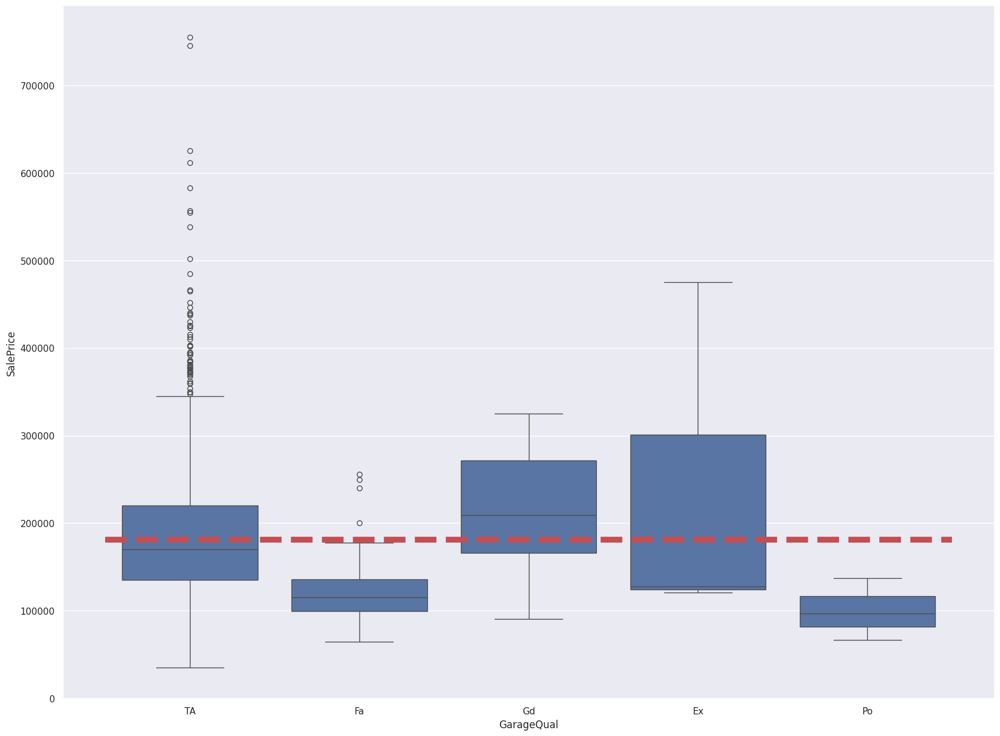

                SalePrice
GarageCond               
Ex          124000.000000
Fa          114654.028571
Gd          179930.000000
Po          108500.000000
TA          187885.735294


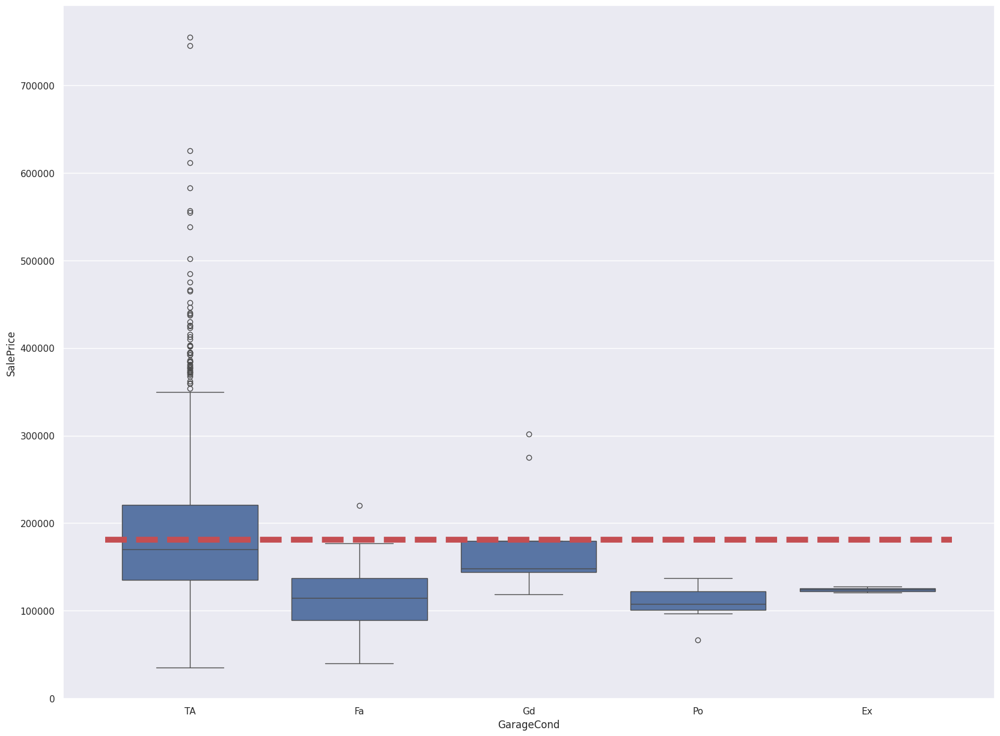

                SalePrice
PavedDrive               
N           115039.122222
P           132330.000000
Y           186433.973881


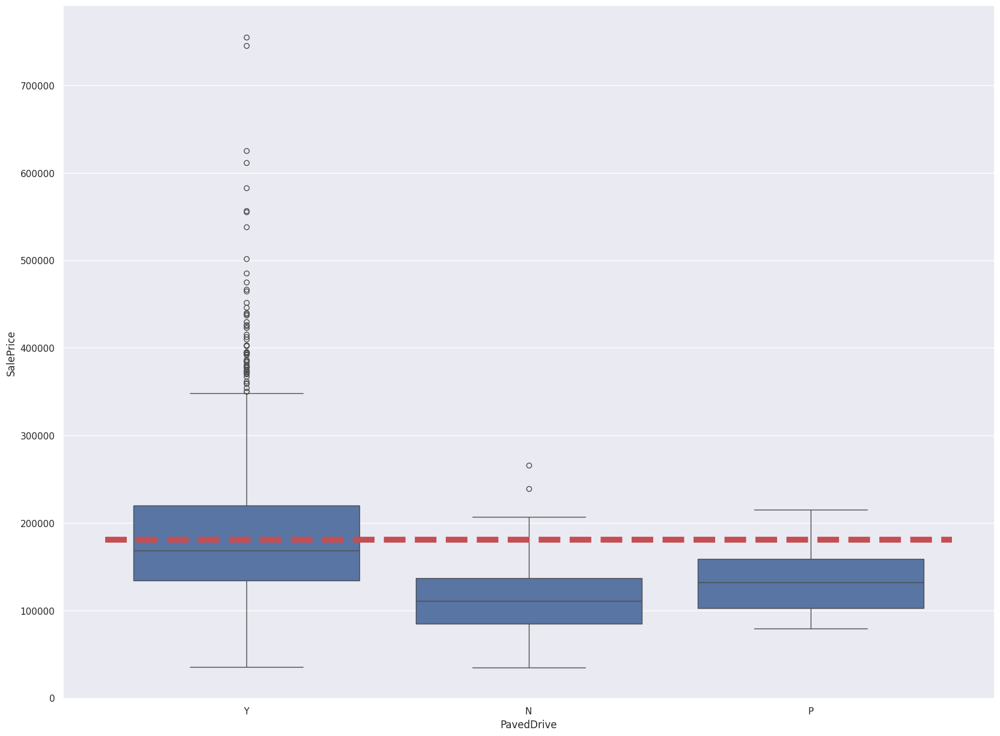

        SalePrice
PoolQC           
Ex       490000.0
Fa       215500.0
Gd       201990.0


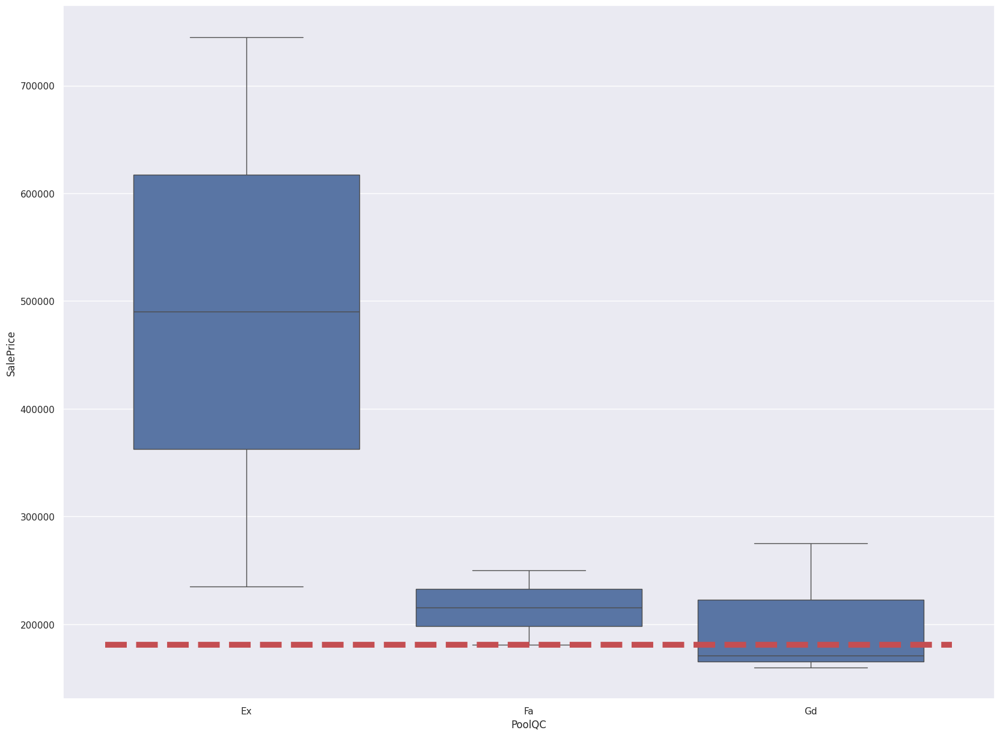

           SalePrice
Fence               
GdPrv  178927.457627
GdWo   140379.314815
MnPrv  148751.089172
MnWw   134286.363636


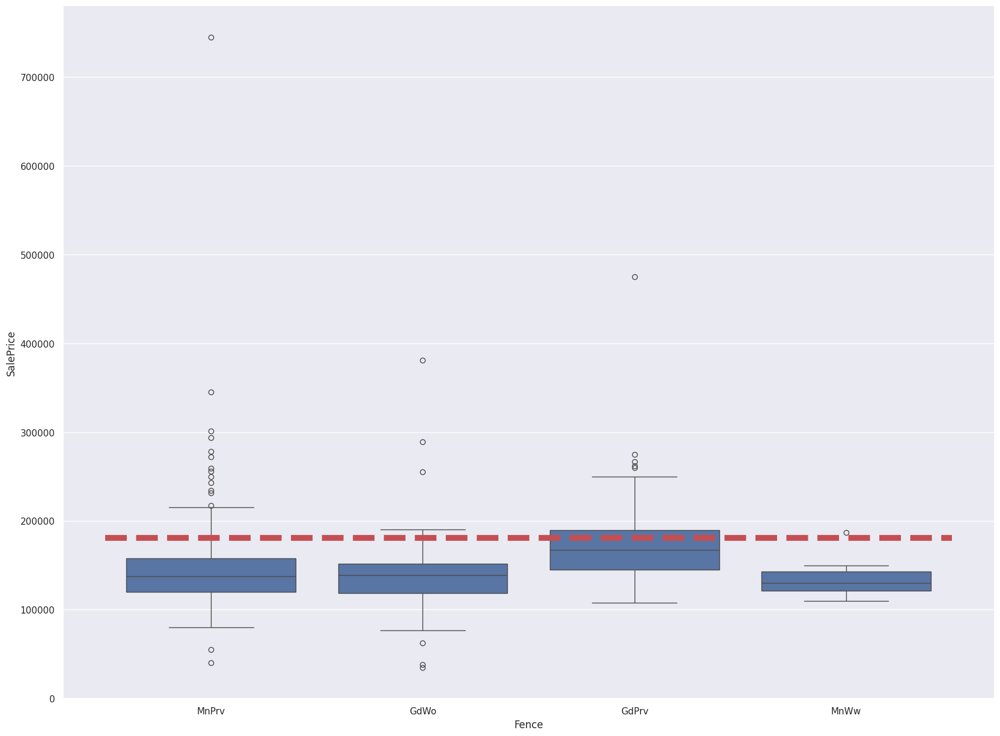

                 SalePrice
MiscFeature               
Gar2         170750.000000
Othr          94000.000000
Shed         151187.612245
TenC         250000.000000


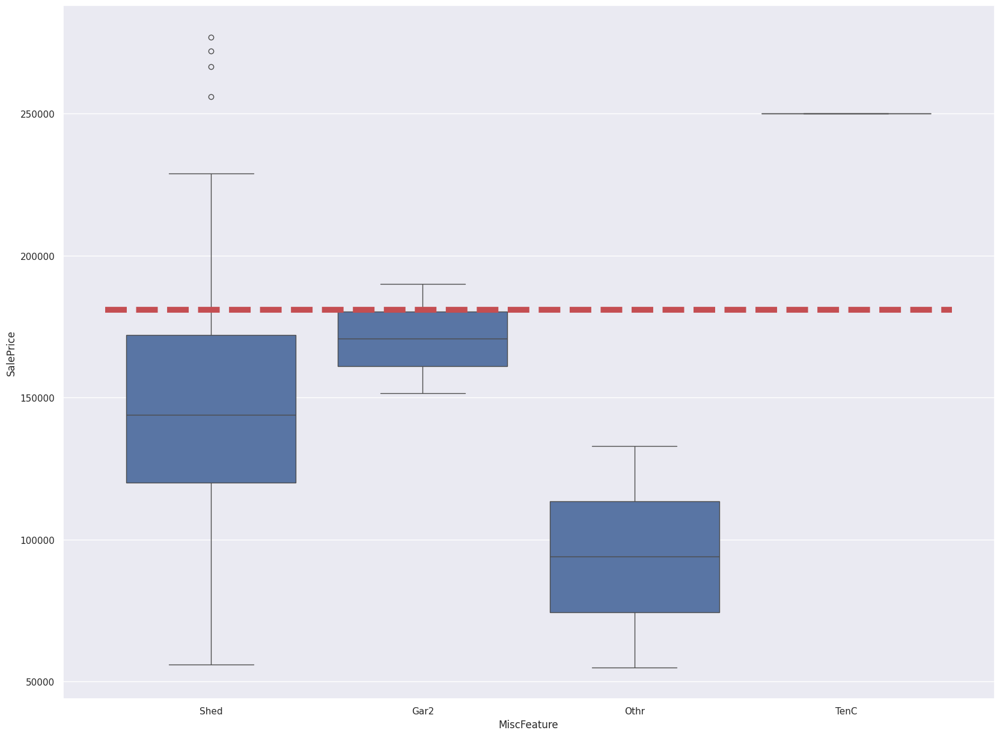

              SalePrice
SaleType               
COD       143973.255814
CWD       210600.000000
Con       269600.000000
ConLD     138780.888889
ConLI     200390.000000
ConLw     143700.000000
New       274945.418033
Oth       119850.000000
WD        173401.836622


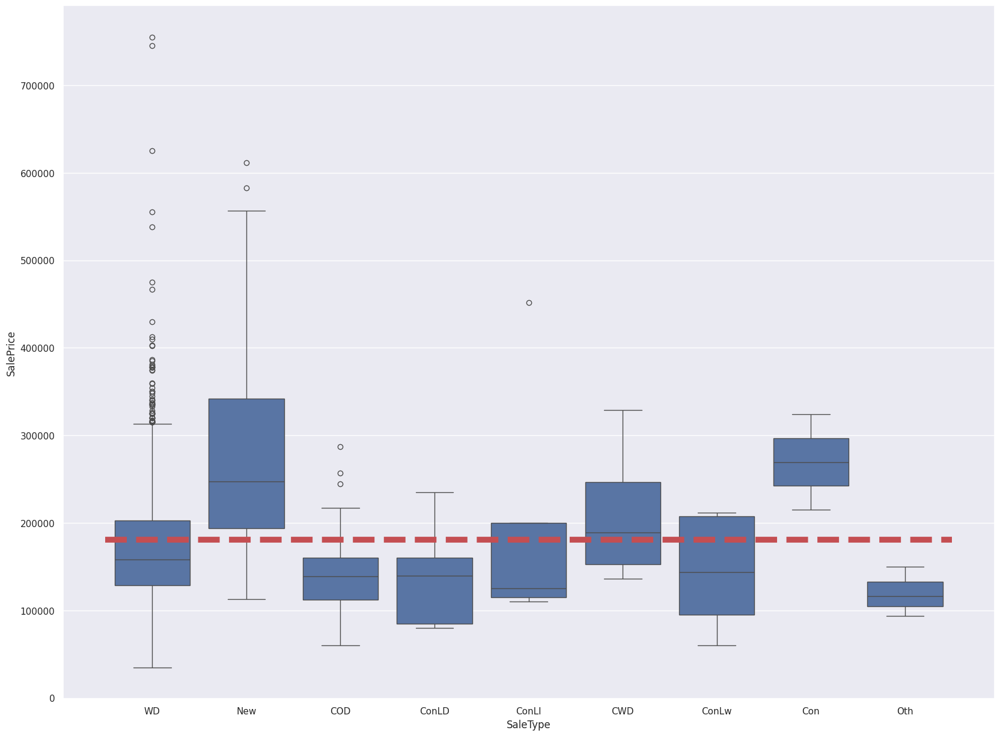

                   SalePrice
SaleCondition               
Abnorml        146526.623762
AdjLand        104125.000000
Alloca         167377.416667
Family         149600.000000
Normal         175202.219533
Partial        272291.752000


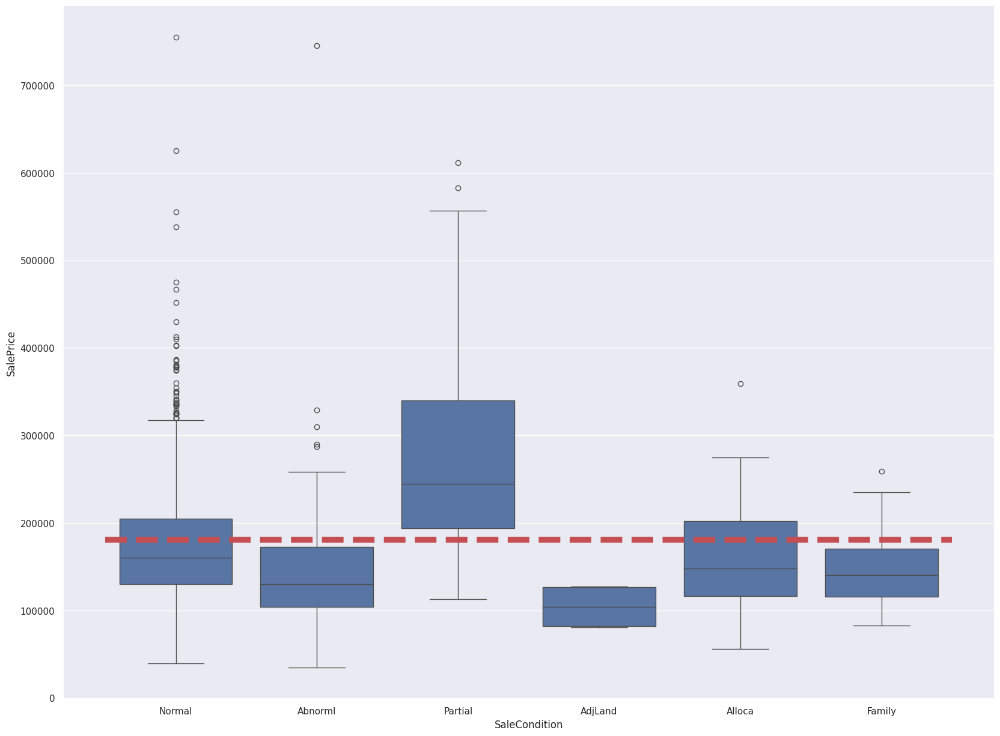

In [63]:
for i,feature in enumerate(object_data.columns):
      df = train[[feature,'SalePrice']].dropna()
      if feature in object_data.columns:
        object_features = pd.unique(df[feature])
        df2 = df.groupby(feature).agg({'SalePrice':'mean'})
        print(df2)
        sns.boxplot(data=df, x=feature, y='SalePrice')
        left, right = plt.xlim()
        plt.hlines(train['SalePrice'].mean(),xmin=left, xmax=right, color='r', linestyles='--', linewidth=7.0)
        plt.show()



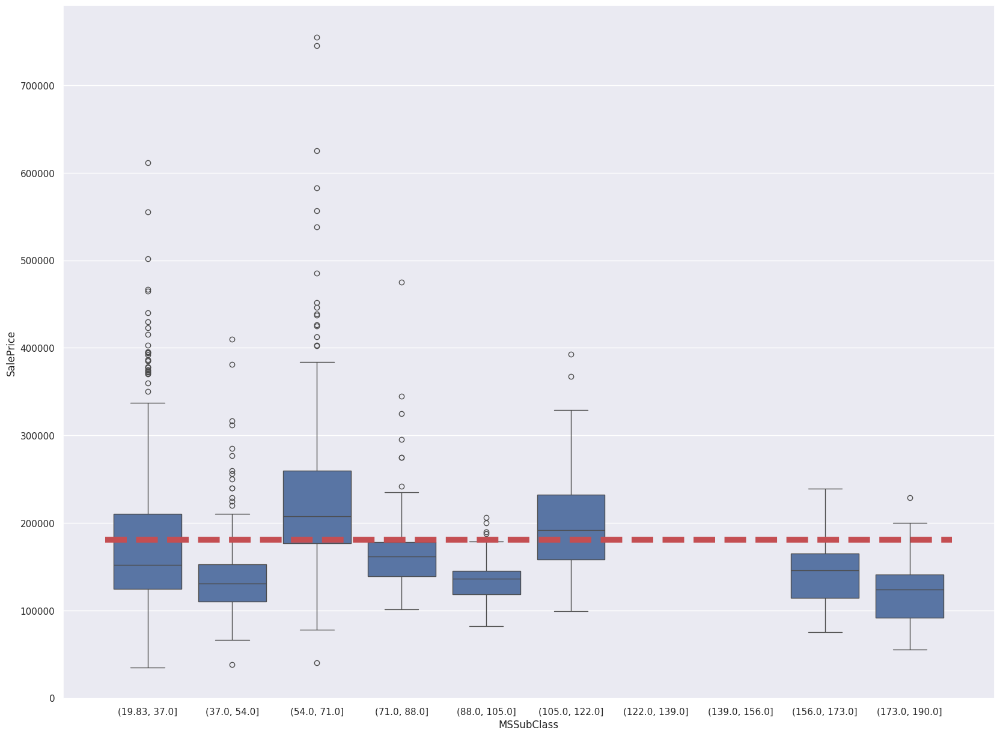

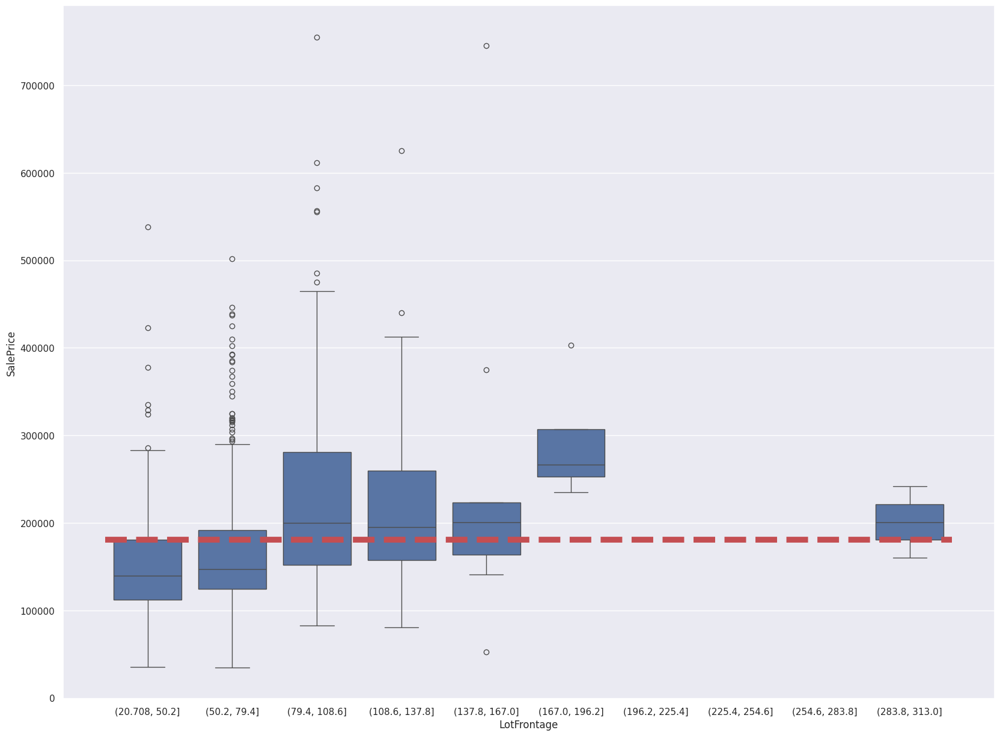

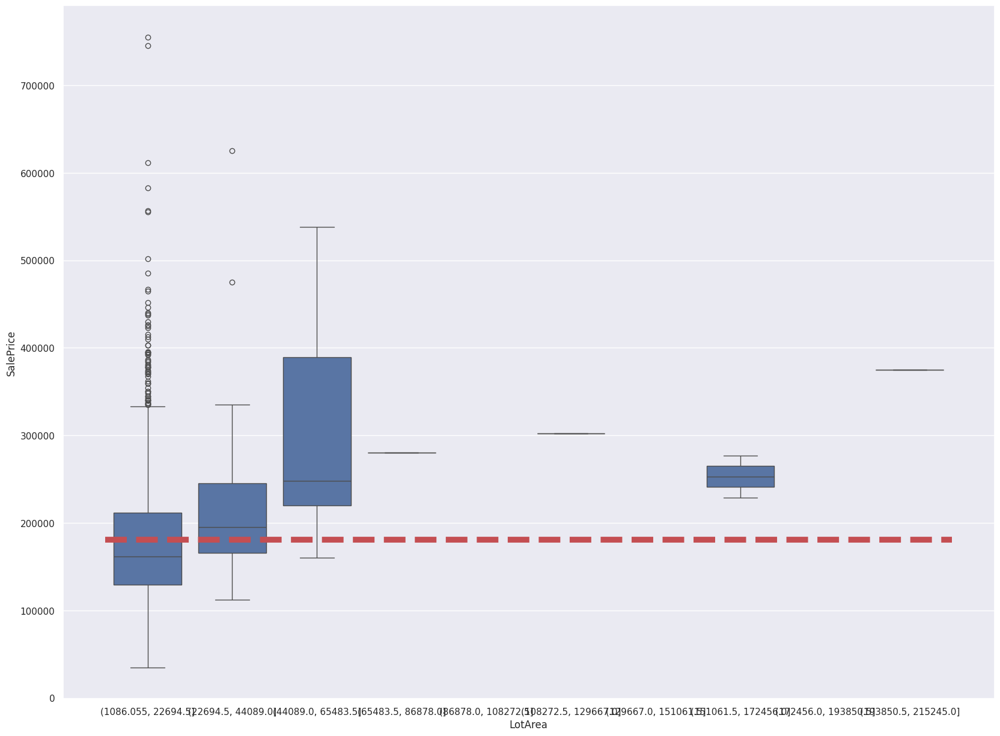

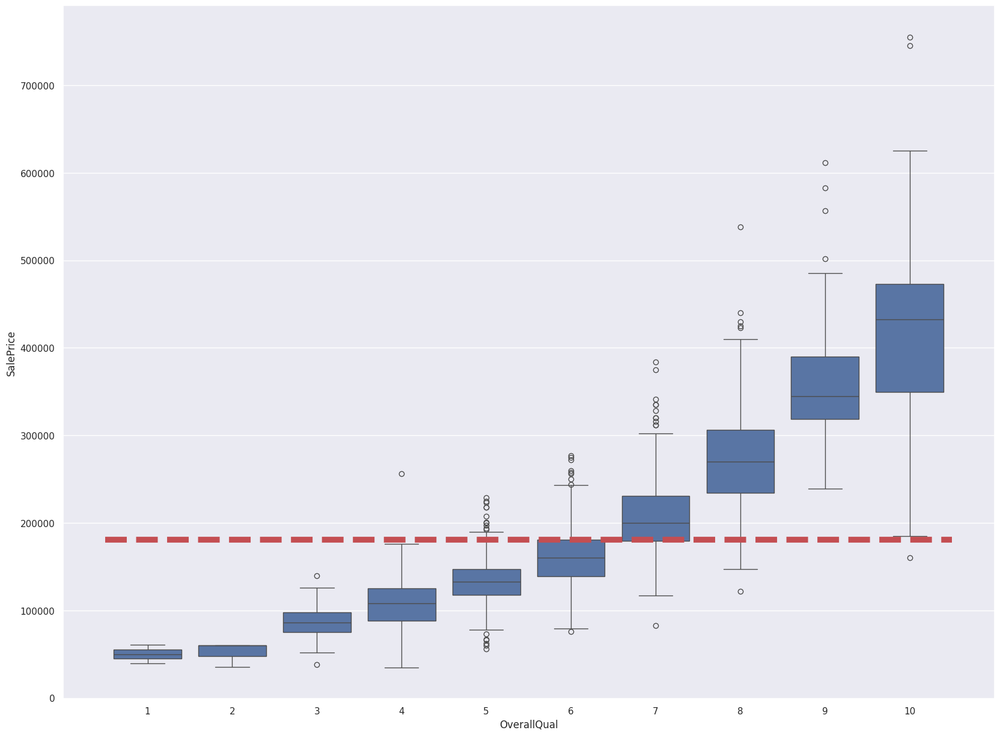

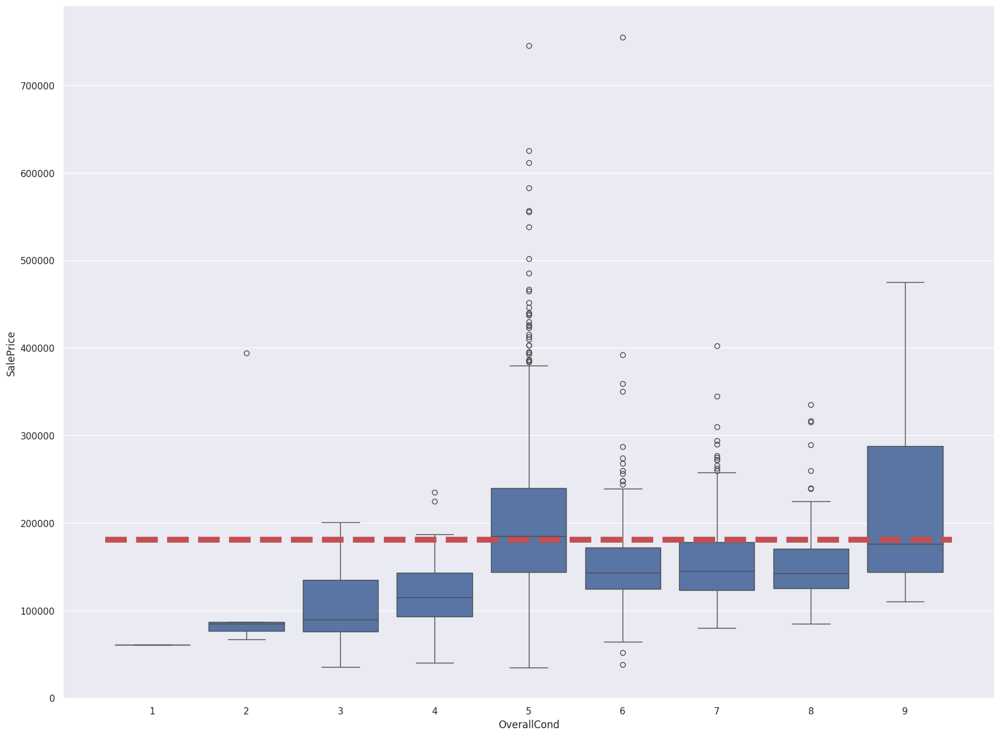

...

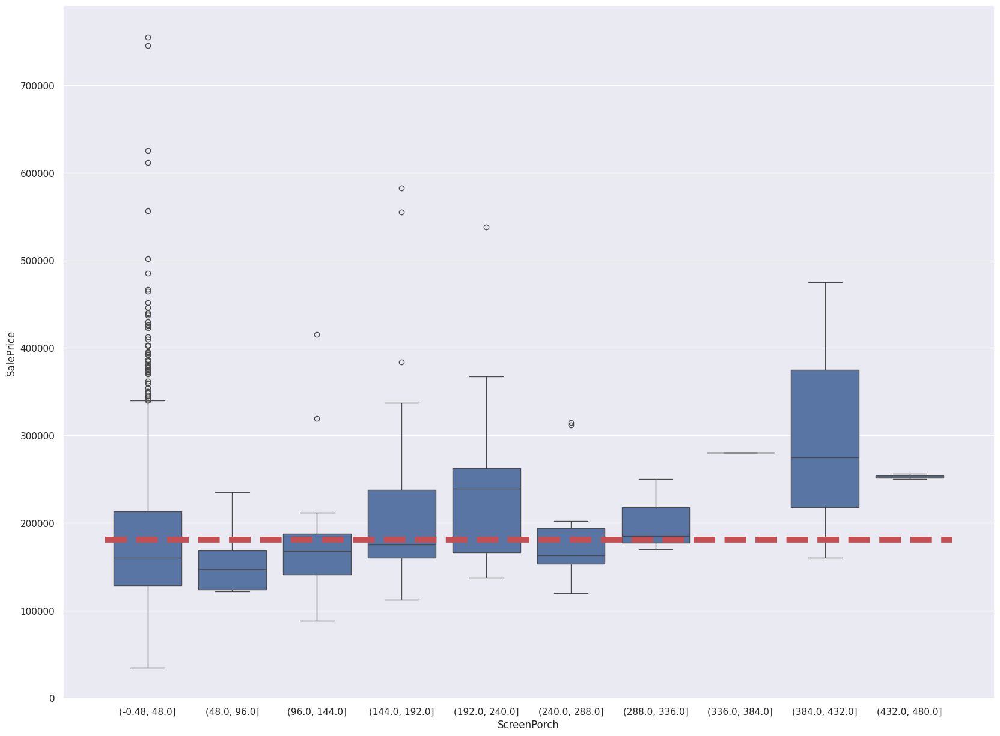

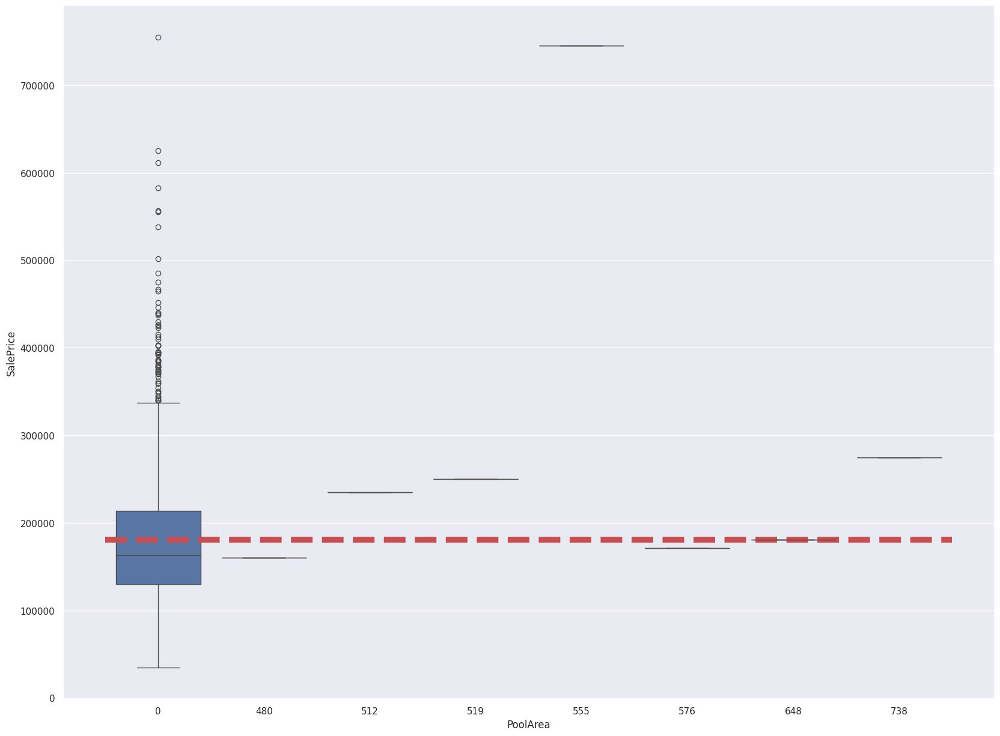

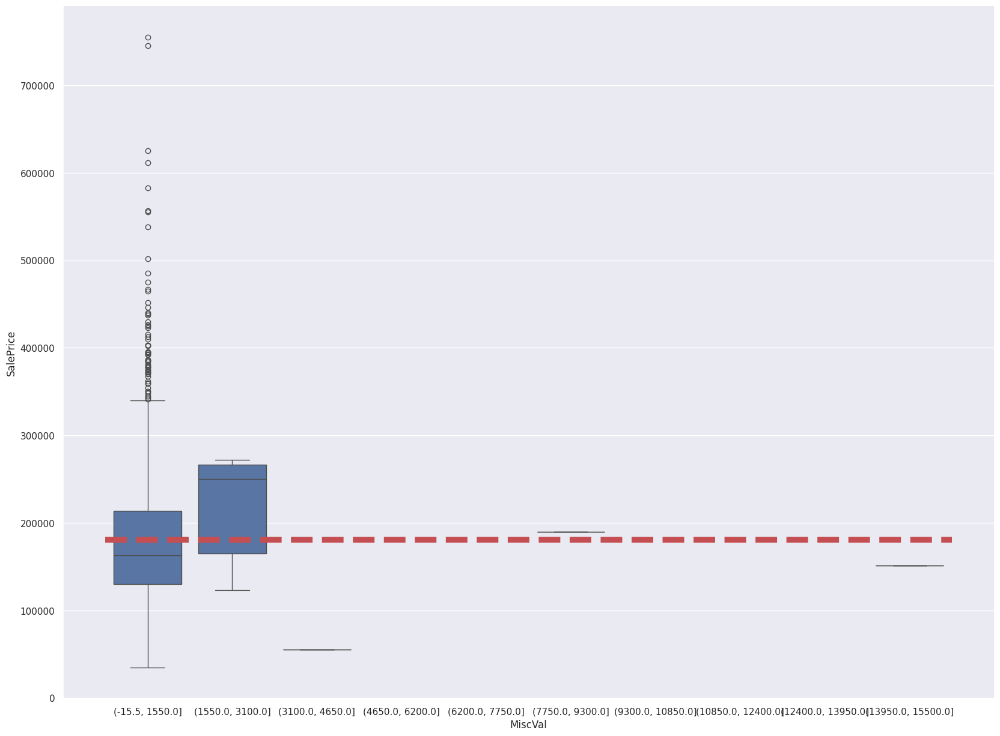

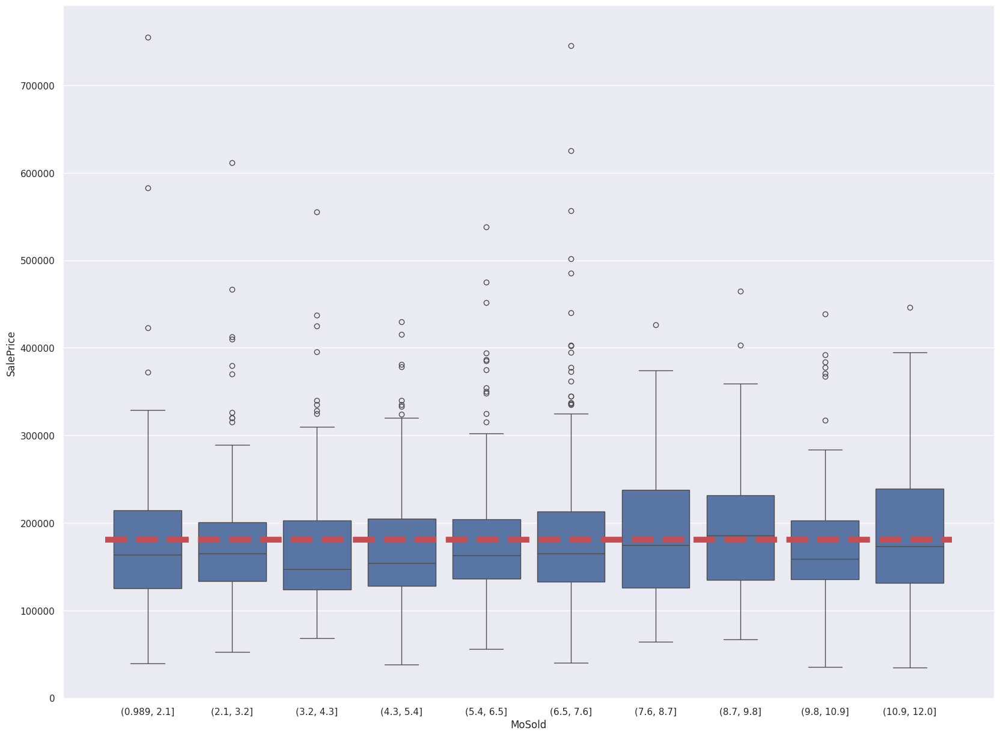

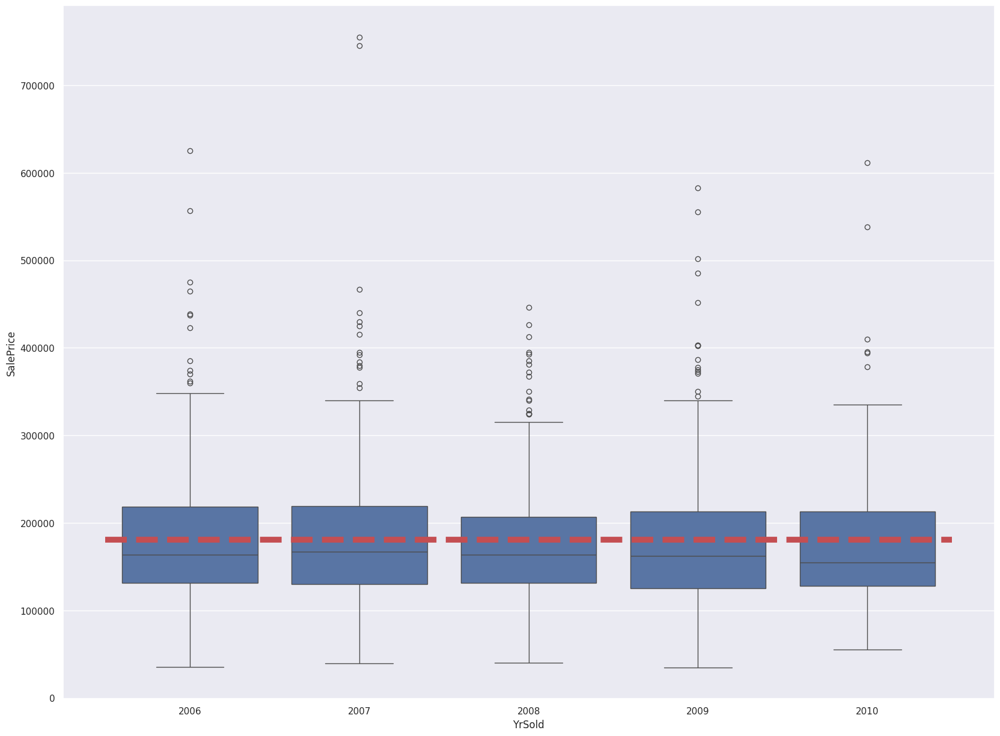

In [62]:
for feature in numeric_data.columns:
  if train[feature].nunique()>10:
    df = train[[feature,'SalePrice']]
    df['period'] = pd.cut(df[feature], bins=10)
    ax = sns.boxplot(data=df, x='period', y='SalePrice')
    left, right = plt.xlim()
    plt.hlines(train['SalePrice'].mean(),xmin=left, xmax=right, color='r', linestyles='--', linewidth=7.0)
    ax.set(xlabel=feature)
  else:
    ax = sns.boxplot(data=train, x=feature, y='SalePrice')
    ax.set(xlabel=feature)
    left, right = plt.xlim()
    plt.hlines(train['SalePrice'].mean(),xmin=left, xmax=right, color='r', linestyles='--', linewidth=7.0)
  plt.show();


# The Baseline Model

In [33]:
from sklearn.model_selection import train_test_split

train = train.drop(columns=["Id"])

y = train["SalePrice"]
X = train.drop(columns=["SalePrice"])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10)

In [34]:
numeric_data = X_train.select_dtypes([np.number])
numeric_data_mean = numeric_data.mean()
numeric_features = numeric_data.columns

X_train = X_train.fillna(numeric_data_mean)
X_test = X_test.fillna(numeric_data_mean)

In [35]:
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error

model = Ridge()
model.fit(X_train[numeric_features], y_train)
y_pred = model.predict(X_test[numeric_features])
y_train_pred = model.predict(X_train[numeric_features])

print("Test RMSE = %.4f" % mean_squared_error(y_test, y_pred, squared=False))
print("Train RMSE = %.4f" % mean_squared_error(y_train, y_train_pred, squared=False))

Test RMSE = 32085.7681
Train RMSE = 35631.3131


In [36]:
from sklearn.metrics import r2_score
r2_score(y_test, y_pred)

0.8242706687562201

In [37]:
from sklearn.model_selection import cross_val_score

cv_scores = cross_val_score(model, X_train[numeric_features], y_train, cv=10, scoring="neg_root_mean_squared_error")
print("Cross validation scores:\n\t", "\n\t".join("%.4f" % x for x in cv_scores))
print("Mean CV MSE = %.4f" % np.mean(-cv_scores))

Cross validation scores:
	 -38825.3172
	-45278.9230
	-31405.3380
	-33890.1048
	-73848.3061
	-24142.7915
	-45523.7066
	-52861.2908
	-26094.3376
	-29693.5005
Mean CV MSE = 40156.3616
